# EDA and Modeling of Housing Prices in Ames, IA

The research question of interest is to accurately predict a house's sale price in Ames, IA based upon 79 possible features. The resulting model can be used by buyers, sellers, and realtors to obtain an estimate (with a confidence interval) of what a house is worth. 

In [1]:
# Libraries
import copy
import os 

import pandas as pd
from patsy import dmatrix
import numpy as np
from math import sqrt
from scipy.stats import skew
from scipy import interpolate

from matplotlib import pyplot as plt
from matplotlib.gridspec import GridSpec
import missingno as msno
import seaborn as sn

from sklearn.preprocessing import MinMaxScaler, PolynomialFeatures
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

## Functions

In [ ]:
def chart_gen(chart, bucket, col, df, features, target = None):
    """
    Uses the parameters to generate charts
    Parameters:
        chart (string): Chart type, options are hist, bar, and scatter
        bucket (int): if hist is chosen, the number of bins must be selected. If hist is not chosen,
        any value will work.
        col (int): number of charts to be in a single grid row for presentation purposes
        df (DataFrame): dataframe that the series are derived from
        features (list): list of features to be charted 
        target (string): name of target variable for scatter plot
    Returns:
        charts for the features chosen unless an incorrect chart name is given. Then a message
        requests the user to use a valid chart name.
    """
    if chart == 'hist':
        COUNT = 0
        fig = plt.figure(figsize=(25, 5))
        gs = GridSpec(nrows=1, ncols=col)

        for i in features:
            ax = fig.add_subplot(gs[0, COUNT])
            ax.hist(df[i], bins=bucket)
            plt.title("Histogram of " + str(i) + " Values")
            COUNT += 1

        plt.show()    
    
    elif chart == 'bar':
        COUNT = 0
        fig = plt.figure(figsize=(25, 5))
        gs = GridSpec(nrows=1, ncols=col)

        for i in features:
            counts = df[i].value_counts().sort_values()
            ax = fig.add_subplot(gs[0, COUNT])
            ax.bar(counts.index, counts)
            plt.xticks(rotation='vertical')
            plt.title("Histogram of " + str(i) + " Values")
            COUNT += 1
    
        plt.show()
        
    elif chart == 'box':
        COUNT = 0
        fig = plt.figure(figsize=(25, 5))
        gs = GridSpec(nrows=1, ncols=col)

        for i in features:
            ax = fig.add_subplot(gs[0, COUNT])
            ax.boxplot(df[i])
            plt.ylabel("Boxplot of " + str(i) + " Values")
            COUNT += 1
        
        fig.tight_layout()
        plt.show()
        
    elif chart == 'scatter':
        COUNT = 0
        fig = plt.figure(figsize=(25, 5))
        gs = GridSpec(nrows=1, ncols=col)

        for i in features:
            ax = fig.add_subplot(gs[0, COUNT])
            ax.scatter(df[i], df[target])
            plt.title("Scatter plot of " + str(i) + " and " + str(target))
            COUNT += 1
        
        fig.tight_layout()
        plt.show()
        
    elif chart == 'scatter-string':
        COUNT = 0
        fig = plt.figure(figsize=(25, 5))
        gs = GridSpec(nrows=1, ncols=col)

        for i in features:
            x_names = df[i].astype('category').drop_duplicates()
            x_values = df[i].astype('category').cat.codes
            ax = fig.add_subplot(gs[0, COUNT])
            ax.scatter(x_values, df[target])
            ax.set_xticks(range(0, len(x_names)))
            ax.set_xticklabels(list(x_names))
            plt.title("Scatter plot of " + str(i) + " and " + str(target))
            COUNT += 1
        
        fig.tight_layout()
        plt.show()
         
    else:
        return print('Please choose a valid chart type: hist, bar, box, scatter, or scatter-string')

In [ ]:
def model_analysis(model, x_input):
    
    # Outliers
    student_resid = model.outlier_test()
    student_resid = np.delete(student_resid, [1, 2], 1)
    df_student_resid = pd.DataFrame(student_resid, columns = ['student_resid'])
    df_student_resid['student_resid'] = df_student_resid['student_resid'].abs()
    outliers = df_student_resid[df_student_resid['student_resid'] > 3]
    print(outliers)
    
    # Leverage
    influence = model.get_influence()
    leverage = influence.hat_matrix_diag
    df_leverage = pd.DataFrame(leverage, columns = ['Leverage'])
    leverage_points = df_leverage[df_leverage['Leverage'] > ((2*len(x_input[0]))+2)/len(x_input)]
    print(leverage_points)

    # Combined Leverage and Outliers
    combo = leverage_points.merge(outliers, how = 'inner', left_index = True, right_index = True)
    print(combo)
    
    # Collinearity
    X = sm.add_constant(x_input)
    # Apply inverse hyperbolic sine since there are values of 0
    X = np.arcsinh(X)
    vif = pd.Series([variance_inflation_factor(X, i) 
               for i in range(X.shape[1])])
    print(vif)
    
    # Chart plotting influence of each observation
    with plt.rc_context():
        plt.rc("figure", figsize=(20, 20))
        sm.graphics.influence_plot(model, criterion="cooks")

In [ ]:
def assumptions(model, num_vars):
    for i in range(1, num_vars + 1):
        try:
            column = 'x' + str(i)
            fig = plt.figure(figsize=(12,8))
            fig = sm.graphics.plot_regress_exog(model, column, fig=fig)
        except:
            next

## Ingest

Ames, IA housing prices and related features for each sale from [Kaggle](https://www.kaggle.com/c/house-prices-advanced-regression-techniques).

In [141]:
train = pd.read_csv('https://raw.githubusercontent.com/jhancuch/housing-prices-ames-ia/main/data/train.csv')
test = pd.read_csv('https://raw.githubusercontent.com/jhancuch/housing-prices-ames-ia/main/data/test.csv')

First five and last five rows of both the training set and test set.

In [3]:
train.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [4]:
train.tail()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
1455,1456,60,RL,62.0,7917,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,8,2007,WD,Normal,175000
1456,1457,20,RL,85.0,13175,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,210000
1457,1458,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,1459,20,RL,68.0,9717,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,4,2010,WD,Normal,142125
1459,1460,20,RL,75.0,9937,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2008,WD,Normal,147500


In [5]:
test.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1461,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,AllPub,...,120,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal
1,1462,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal
2,1463,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal
3,1464,60,RL,78.0,9978,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,6,2010,WD,Normal
4,1465,120,RL,43.0,5005,Pave,NaN,IR1,HLS,AllPub,...,144,0,NaN,NaN,NaN,0,1,2010,WD,Normal


In [6]:
test.tail()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
1454,2915,160,RM,21.0,1936,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,6,2006,WD,Normal
1455,2916,160,RM,21.0,1894,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,4,2006,WD,Abnorml
1456,2917,20,RL,160.0,20000,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,9,2006,WD,Abnorml
1457,2918,85,RL,62.0,10441,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,MnPrv,Shed,700,7,2006,WD,Normal
1458,2919,60,RL,74.0,9627,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,11,2006,WD,Normal


Column names and shape for both train and test sets

In [7]:
print(train.columns)
print(train.shape)

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

In [8]:
print(test.columns)
print(test.shape)

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

## EDA

### Distributions

#### Dependent Variable

Check the distribution of the dependent variable. 

Several important items are observed about the dependent variable. First, using a histogram of the dependent variable values to visually represent the distribution, we can see SalePrice has a long right-hand tail. This means the variable has a positive skew and we see this in the statistic computed with the value of 1.88. We can also note the skew from the difference between the mean and median. The mean can be heavily influenced by outliers and we see that the mean SalePrice is \\$180,921 while the median is $163,000 indicating outliers on the right-hand of the distribution. In Ames, Iowa, it appears that the median house for \\$163,000 but the top 25\\% of sales sell for \\$214,000 or higher with a max of \\$755,000. With a standard deviation of \\$79,442, the top quartile contains observations outside of the 3 standard deviation rule indicating we may have outliers. 

Thus, due to the skew and outliers, I take the log of SalePrice. I will run plots and correlation heat maps with both SalePriceLog and SalePrice. My initial intuition is that SalePriceLog will be good to be used with a linear model with no non-linear components since the log will create a more normal distribution of the dependent variable. However, for linear models with non-linear components, I think SalePrice may be the better target feature since the non-linear features on the right hand of the equation will handle the non-linear aspects of the data.

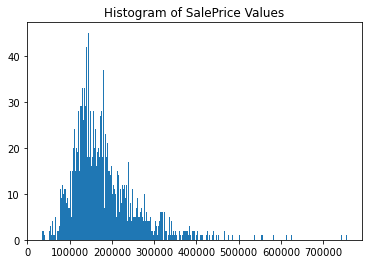

Dependent Variable Summary Statistics:
count      1460.000000
mean     180921.195890
std       79442.502883
min       34900.000000
25%      129975.000000
50%      163000.000000
75%      214000.000000
max      755000.000000
Name: SalePrice, dtype: float64

Dependent Variable Median: 163000.0
Dependent Variable Mean: 180921.0

Skew statistic : 1.880940746034036


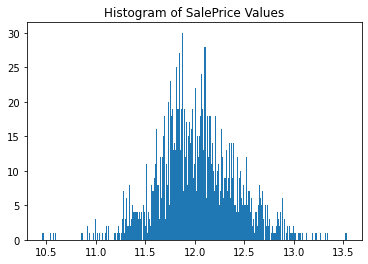

In [9]:
plt.hist(train['SalePrice'], bins = 300)
plt.title("Histogram of SalePrice Values")
plt.show()

print('Dependent Variable Summary Statistics:\n{0}\n'.format(train['SalePrice'].describe()))
print('Dependent Variable Median: {0}'.format(round(train['SalePrice'].median(), 0)))
print('Dependent Variable Mean: {0}\n'.format(round(train['SalePrice'].mean(), 0)))
print('Skew statistic : {0}'.format(skew(train['SalePrice'])))

plt.hist(np.log(train['SalePrice']), bins = 300)
plt.title("Histogram of SalePrice Values")
plt.show()

train['SalePriceLog'] = np.log(train['SalePrice'])

#### Independent Variables

I check the distribution of the independent variables. The data set includes variables with a bell curve distribution, strong right skew, strong left skew, univariate distribution, and variables whose values fall within a single bucket.

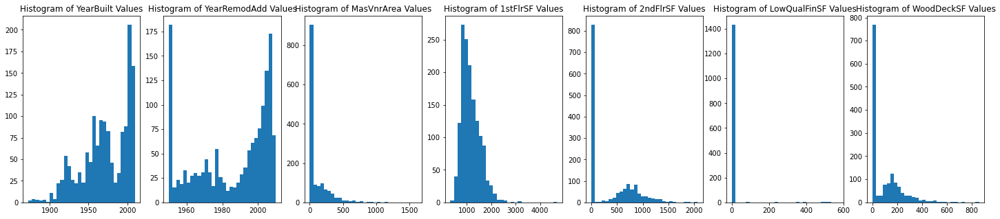

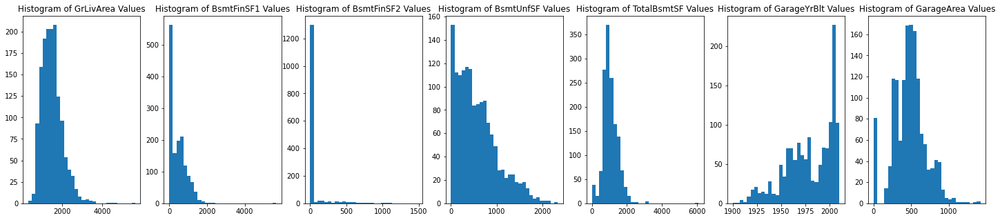

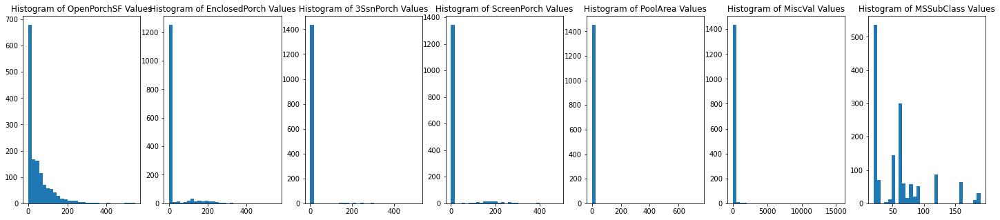

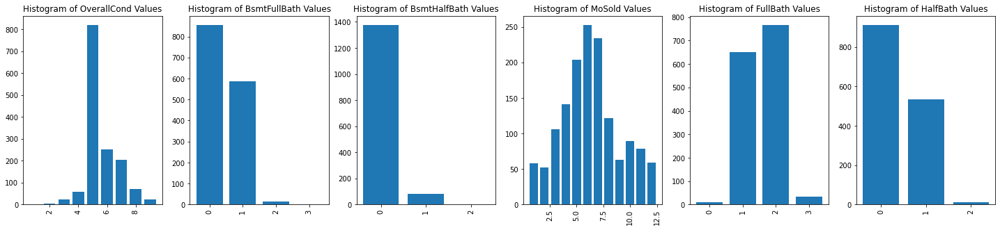

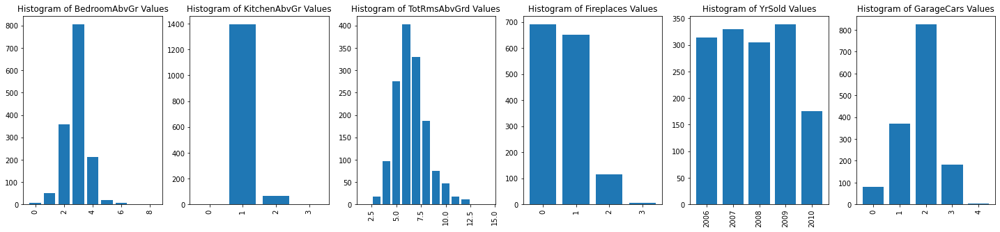

...

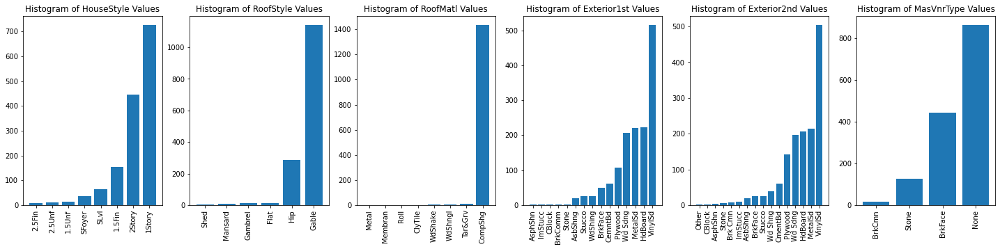

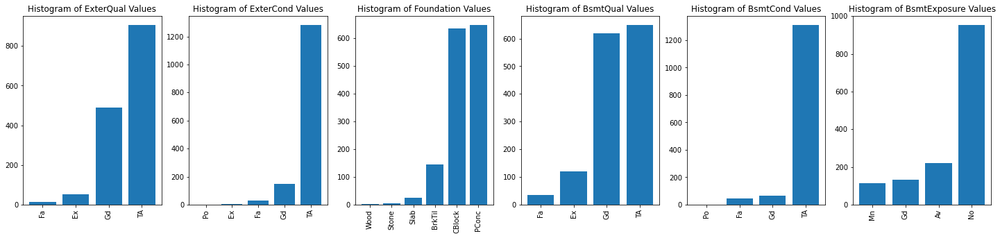

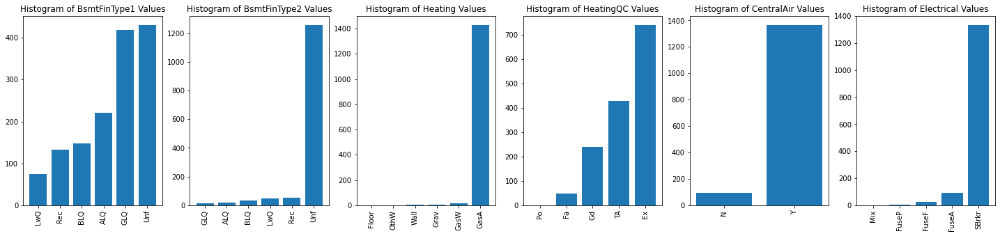

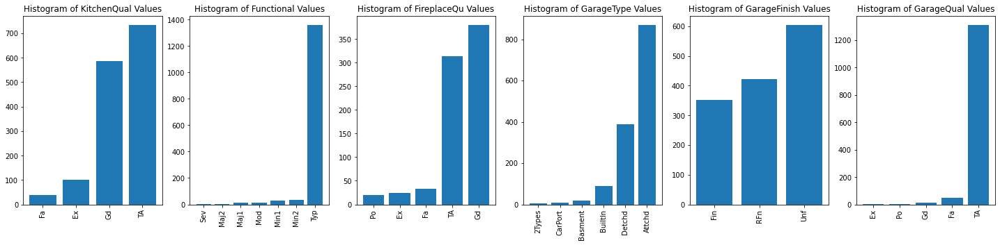

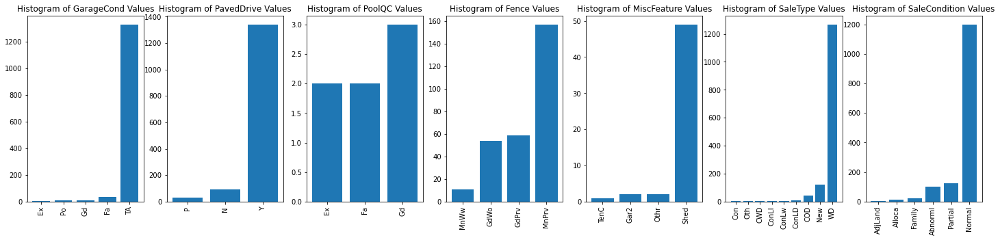

In [10]:
chart_gen('hist', 30, 7, train, ['YearBuilt', 'YearRemodAdd', 'MasVnrArea', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'WoodDeckSF'])
chart_gen('hist', 30, 7, train, ['GrLivArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'GarageYrBlt', 'GarageArea'])
chart_gen('hist', 30, 7, train, ['OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal', 'MSSubClass'])
chart_gen('bar', 0, 6, train, ['OverallCond', 'BsmtFullBath', 'BsmtHalfBath', 'MoSold', 'FullBath', 'HalfBath'])
chart_gen('bar', 0, 6, train, ['BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'YrSold', 'GarageCars'])
chart_gen('bar', 0, 6, train, ['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities'])
chart_gen('bar', 0, 6, train, ['LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType'])
chart_gen('bar', 0, 6, train, ['HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType'])
chart_gen('bar', 0, 6, train, ['ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure'])
chart_gen('bar', 0, 6, train, ['BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical'])
chart_gen('bar', 0, 6, train, ['KitchenQual', 'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual'])
chart_gen('bar', 0, 7, train, ['GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature', 'SaleType', 'SaleCondition'])

### Relationship between dependent variables and independent variables

Since our target feature to estimate is SalePrice and SalePriceLog, I visually examine the relationship between the dependent variables and independent variables by plotting a scatter plot with SalePrice and SalePriceLog as the y axis and independent variables on the x axis. One model will contain non-linear components so I want to see if using a transformed target variable works best with the non-linear components or if I should use a non-transformed target variable.

I find that SalePriceLog removes some of the non-linearity in relationships with independent variables (YearBuilt, YearRemodAdd, 2ndFlSF, and BsmtUnfSF to name a few). Thus, this solidifies my choice to have a linear model with SalePriceLog as the target feature and then have a second linear model with non-linear components with the target feature of SalePrice

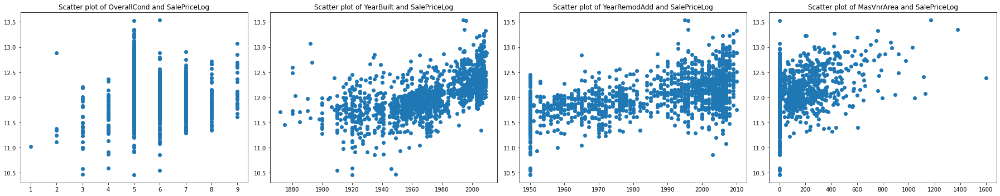

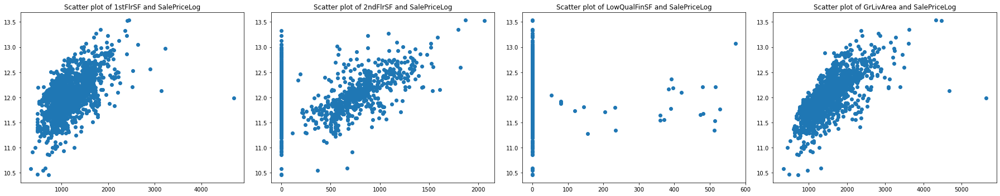

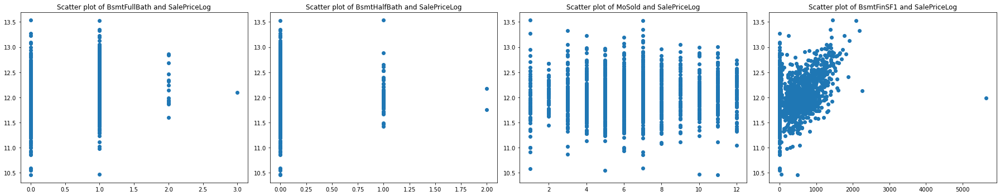

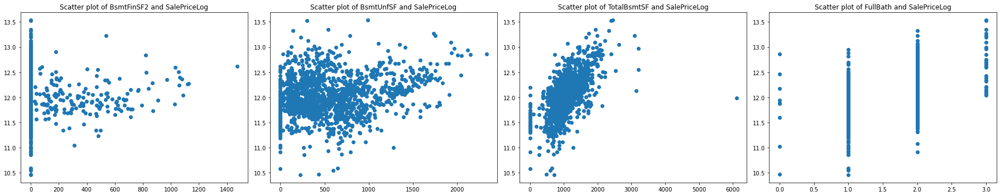

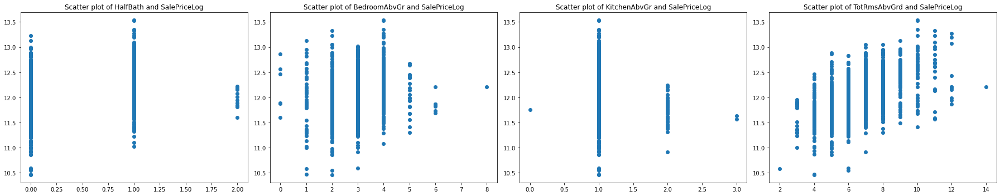

...

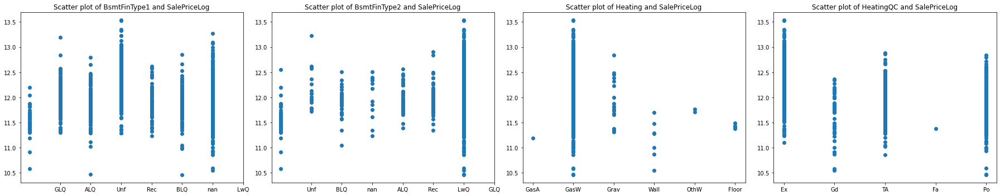

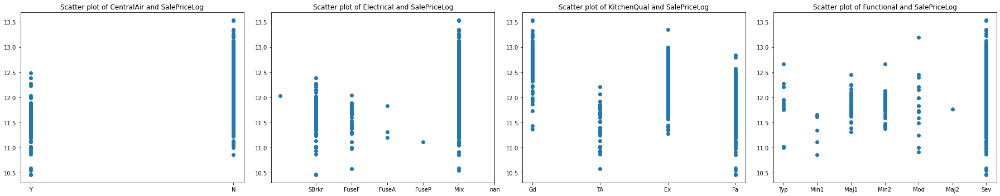

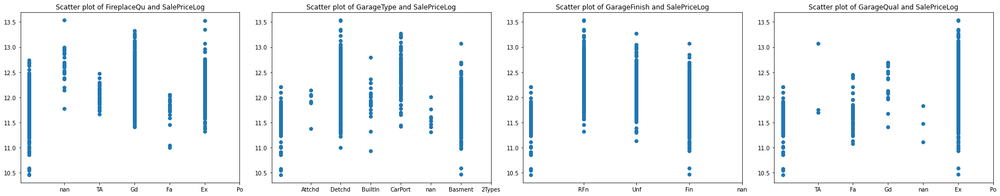

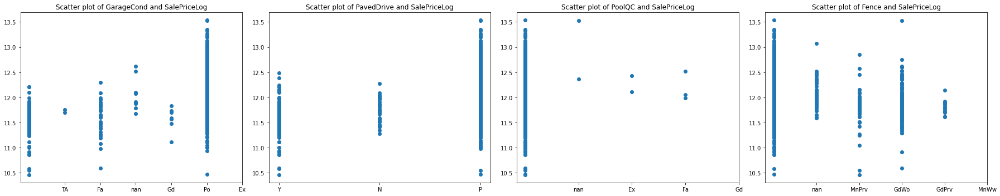

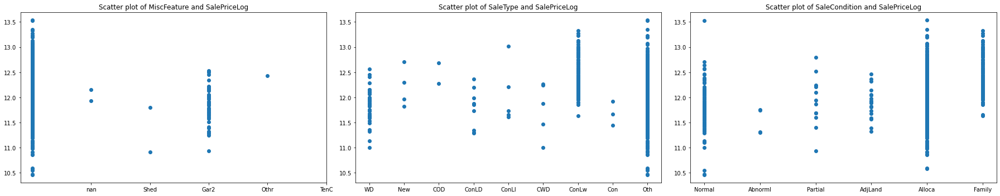

In [11]:
chart_gen('scatter', 0, 4, train, ['OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea'], 'SalePriceLog')
chart_gen('scatter', 0, 4, train, ['1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea'], 'SalePriceLog')
chart_gen('scatter', 0, 4, train, ['BsmtFullBath', 'BsmtHalfBath', 'MoSold', 'BsmtFinSF1'], 'SalePriceLog')
chart_gen('scatter', 0, 4, train, ['BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'FullBath'], 'SalePriceLog')
chart_gen('scatter', 0, 4, train, ['HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd'], 'SalePriceLog')
chart_gen('scatter', 0, 4, train, ['Fireplaces', 'YrSold', 'GarageYrBlt', 'GarageCars'], 'SalePriceLog')
chart_gen('scatter', 0, 4, train, ['GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch'], 'SalePriceLog')
chart_gen('scatter', 0, 5, train, ['3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal', 'MSSubClass'], 'SalePriceLog')
chart_gen('scatter-string', 0, 4, train, ['MSZoning', 'Street', 'Alley', 'LotShape'], 'SalePriceLog')
chart_gen('scatter-string', 0, 4, train, ['LandContour', 'Utilities', 'LotConfig', 'LandSlope'], 'SalePriceLog')
chart_gen('scatter-string', 0, 4, train, ['Neighborhood', 'Condition1', 'Condition2', 'BldgType'], 'SalePriceLog')
chart_gen('scatter-string', 0, 4, train, ['HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st'], 'SalePriceLog')
chart_gen('scatter-string', 0, 4, train, ['Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond'], 'SalePriceLog')
chart_gen('scatter-string', 0, 4, train, ['Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure'], 'SalePriceLog')
chart_gen('scatter-string', 0, 4, train, ['BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC'], 'SalePriceLog')
chart_gen('scatter-string', 0, 4, train, ['CentralAir', 'Electrical', 'KitchenQual', 'Functional'], 'SalePriceLog')
chart_gen('scatter-string', 0, 4, train, ['FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual'], 'SalePriceLog')
chart_gen('scatter-string', 0, 4, train, ['GarageCond', 'PavedDrive', 'PoolQC', 'Fence'], 'SalePriceLog')
chart_gen('scatter-string', 0, 3, train, ['MiscFeature', 'SaleType', 'SaleCondition'], 'SalePriceLog')

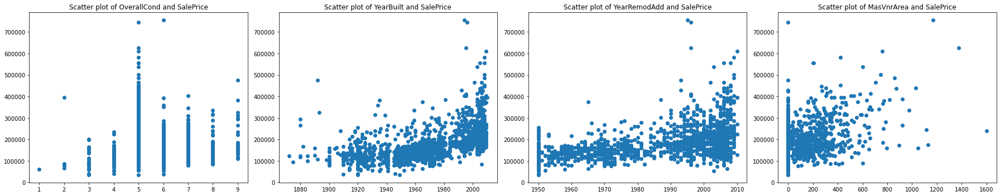

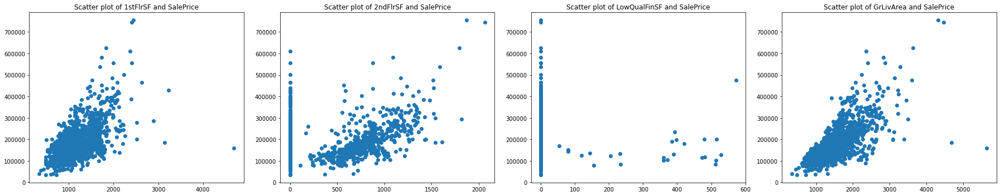

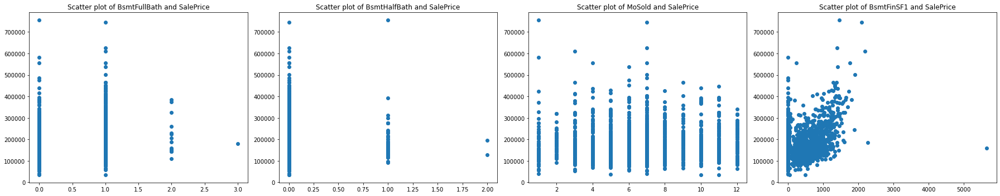

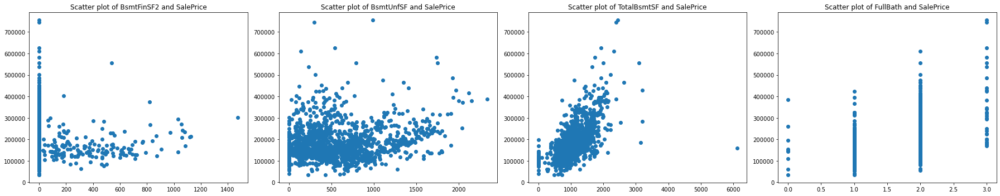

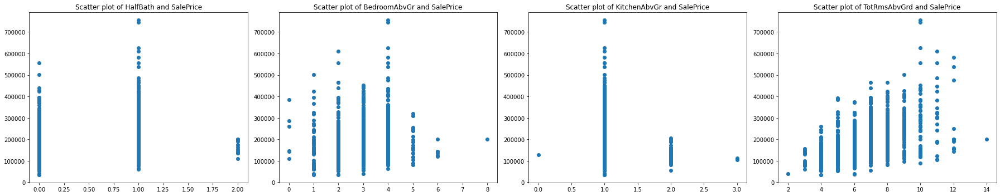

...

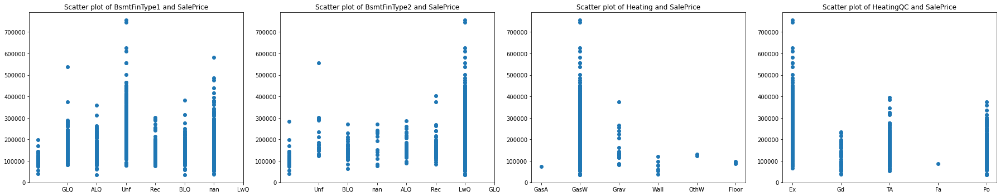

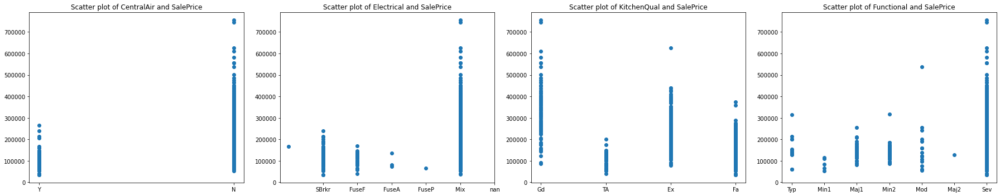

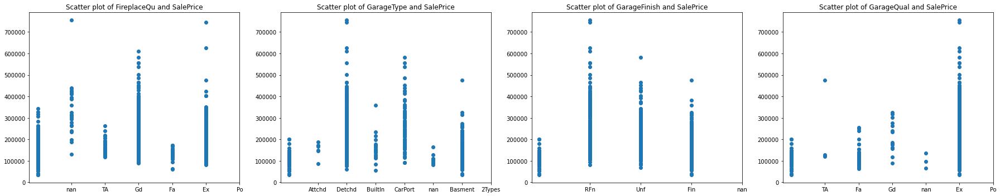

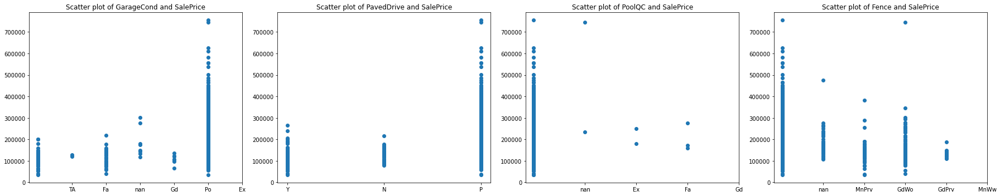

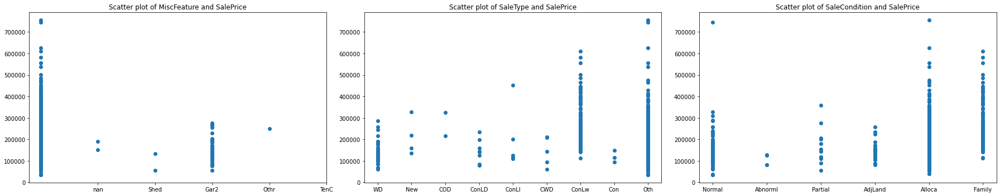

In [12]:
chart_gen('scatter', 0, 4, train, ['OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea'], 'SalePrice')
chart_gen('scatter', 0, 4, train, ['1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea'], 'SalePrice')
chart_gen('scatter', 0, 4, train, ['BsmtFullBath', 'BsmtHalfBath', 'MoSold', 'BsmtFinSF1'], 'SalePrice')
chart_gen('scatter', 0, 4, train, ['BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'FullBath'], 'SalePrice')
chart_gen('scatter', 0, 4, train, ['HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd'], 'SalePrice')
chart_gen('scatter', 0, 4, train, ['Fireplaces', 'YrSold', 'GarageYrBlt', 'GarageCars'], 'SalePrice')
chart_gen('scatter', 0, 4, train, ['GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch'], 'SalePrice')
chart_gen('scatter', 0, 5, train, ['3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal', 'MSSubClass'], 'SalePrice')
chart_gen('scatter-string', 0, 4, train, ['MSZoning', 'Street', 'Alley', 'LotShape'], 'SalePrice')
chart_gen('scatter-string', 0, 4, train, ['LandContour', 'Utilities', 'LotConfig', 'LandSlope'], 'SalePrice')
chart_gen('scatter-string', 0, 4, train, ['Neighborhood', 'Condition1', 'Condition2', 'BldgType'], 'SalePrice')
chart_gen('scatter-string', 0, 4, train, ['HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st'], 'SalePrice')
chart_gen('scatter-string', 0, 4, train, ['Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond'], 'SalePrice')
chart_gen('scatter-string', 0, 4, train, ['Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure'], 'SalePrice')
chart_gen('scatter-string', 0, 4, train, ['BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC'], 'SalePrice')
chart_gen('scatter-string', 0, 4, train, ['CentralAir', 'Electrical', 'KitchenQual', 'Functional'], 'SalePrice')
chart_gen('scatter-string', 0, 4, train, ['FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual'], 'SalePrice')
chart_gen('scatter-string', 0, 4, train, ['GarageCond', 'PavedDrive', 'PoolQC', 'Fence'], 'SalePrice')
chart_gen('scatter-string', 0, 3, train, ['MiscFeature', 'SaleType', 'SaleCondition'], 'SalePrice')

### Missing Values

I first determine which independent variables have missing values and on average, how many missing values does an observation have.

Three items jump out after the initial analysis. First, all observations are missing at  least 1 value with the vast majority (87%) missing 3-5 values. These 3-5 independent variables missing for an observation are likely to be Alley, FireplaceQu, PoolQC, Fence, and MiscFeature since they have the highest amount missing. 

Second, related variables appear to have a similar number of missing values. For example, the independent variables related to basements are missing values for 37 observations (and 36 in one of the features) and independent variables related to garages are all missing values for 81 observations.

Third, the NaN's may represent the feature not existing rather than actual missing data. Looking at the above distribution graphs, we can that for Alley, FireplaceQu, PoolQC, Fence, and MiscFeature, none of these variables have a "None" or "Not Applicable" value. This is a strong assumption but makes sense since not all houses have an alley, fireplace, pool, fence, or miscellaneous feature. We can verify this theory for at least PoolQC through the PoolArea variable that is not missing any data. 

Looking at the data_description.txt file, we do see the NA has been used to signify None for PoolQC, Fence, MiscFeature, and Alley. We will replace this value in the preprocessing stage to signify None.

Imputation or dropping observations/columns will occur under the preprocessing step.

In [13]:
# Determine how many NAN values each observation has
train['n_na'] = 0
for i in range(0, len(train)):
    train.loc[i, 'n_na'] = train.loc[i, :].isnull().sum()

print("Value Counts of the # of NaN's in an observation:")
print(train['n_na'].value_counts().sort_values(ascending=False))

Value Counts of the # of NaN's in an observation:
4     635
5     501
3     132
10     60
6      58
9      32
2      16
11      7
8       5
7       5
15      4
14      3
1       2
Name: n_na, dtype: int64


In [14]:
# Obtain the name of the column and number of missing values

missing_values = pd.DataFrame(columns = ['Column Name', '# NaN'])

for i in range(0, len(train.columns)):
    count = train.iloc[:, i].isnull().sum()
    if count > 0:
        new_row = {'Column Name': train.columns[i], '# NaN': count}
        missing_values = missing_values.append(new_row, ignore_index=True)

In [15]:
missing_values

,Column Name,# NaN
0,LotFrontage,259
1,Alley,1369
2,MasVnrType,8
3,MasVnrArea,8
4,BsmtQual,37
5,BsmtCond,37
6,BsmtExposure,38
7,BsmtFinType1,37
8,BsmtFinType2,38
9,Electrical,1


<AxesSubplot:>

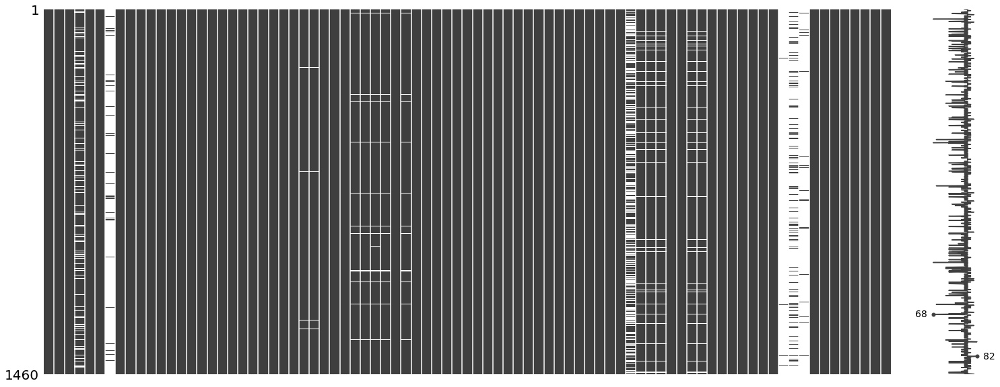

In [16]:
msno.matrix(train[train['SalePriceLog'].notnull()])

## Preprocessing 

The following steps first deal with missing data, then feature creation, dummy variables for categorical variables, and correlation heat maps to down-select features to include in the model.

First we create a new deep copy of the training set and drop the Id column which isn't needed since we can also use the index for joins and the Id variable provides no predictive value

In [17]:
train_clean = copy.deepcopy(train)
train_clean.drop(columns = ['Id'], axis = 1, inplace = True)

### Missing data

#### Variables: Fence, MiscFeature, PoolQC, FireplaceQu, and Alley

I tackle Fence, MiscFeature, PoolQC, FireplaceQu, Alley in a grouping since these five consist of the most missing values by a wide margin and all their NaNs should be recoded as "None"

In [18]:
for i in ['Fence', 'MiscFeature', 'PoolQC', 'FireplaceQu', 'Alley']:
    train_clean[i] = train_clean[i].fillna('None')

#### Variables: GarageType, GarageYrBlt, GarageFinish, GarageQual, GarageCond

I tackle garage related variables in a single grouping. Looking at data_description.txt, all their NaNs should be recoded as "None" to represent the property not having a garage.

In [19]:
for i in ['GarageType', 'GarageYrBlt', 'GarageFinish', 'GarageQual', 'GarageCond']:
    train_clean[i] = train_clean[i].fillna('None')

#### Variables: BsmtQual, BsmtCond, BsmtExposure, BsmtFinType1, BsmtFinType2

I tackle basement related variables in a single grouping. Looking at data_description.txt, all their NaNs should be recoded as "None" to represent the property not having a basement.

However, for BsmtExposure, we have an extra missing value compared to the rest. If the observation has a valid value for BasmtCond, then we could assume that it is meant to be coded as "No Exposure" rather than "No Basement". For BsmtFinType2, we also have an extra missing value compared to the rest. If the BsmtFinSF2 is greater than 0, we will assume "Unfinished". If it is equal to zero, then we will assume "No Basement"

In [20]:
train_clean.loc[(pd.isna(train_clean['BsmtCond']) == True) & (pd.isna(train_clean['BsmtExposure']) == True), 'BsmtExposure'] = 'No Exposure'
train_clean.loc[(pd.isna(train_clean['BsmtCond']) == False) & (pd.isna(train_clean['BsmtExposure']) == True), 'BsmtExposure'] = 'None'

In [21]:
train_clean.loc[(train_clean['BsmtFinSF2'] > 0) & (pd.isna(train_clean['BsmtFinType2']) == True), 'BsmtFinType2'] = 'No Exposure'
train_clean.loc[(train_clean['BsmtFinSF2'] == 0) & (pd.isna(train_clean['BsmtFinType2']) == True), 'BsmtFinType2'] = 'None'

In [22]:
for i in ['BsmtQual', 'BsmtCond', 'BsmtFinType1']:
    train_clean[i] = train_clean[i].fillna('None')

#### Variable: LotFrontage

Since there are other Lot variables, such as LotArea, LotShape, and LotConfig, I drop LotFrontage. The assumption is that these three variables will share some of the same explanation to the dependent variable variance as LotFrontage. Additionally, with 259 missing values, the imputation would have low accuracy.


In [23]:
train_clean.drop(columns = ['LotFrontage'], axis = 1, inplace = True)

#### Variable: Electrical

There is only one missing observation so I insert the most common value, in this case SBrkr which is found in 91.2% of all homes in the data set.

In [24]:
train_clean['Electrical'].value_counts()

SBrkr    1334
FuseA      94
FuseF      27
FuseP       3
Mix         1
Name: Electrical, dtype: int64

In [25]:
train_clean.loc[pd.isna(train_clean['Electrical']) == True, 'Electrical'] = 'SBrkr'

#### Variables: MasVnrType and MasVnrArea

To impute the values for MasVnrType and MasVnrArea, I use the median value, which in this case is no masonry and thus 0 area.

In [26]:
print(train_clean['MasVnrType'].value_counts())
print(train_clean['MasVnrArea'].value_counts())

train_clean.loc[pd.isna(train_clean['MasVnrType']) == True, 'MasVnrType'] = 'None'
train_clean.loc[pd.isna(train_clean['MasVnrArea']) == True, 'MasVnrArea'] = 0.0

None       864
BrkFace    445
Stone      128
BrkCmn      15
Name: MasVnrType, dtype: int64
0.0      861
180.0      8
72.0       8
108.0      8
120.0      7
        ... 
562.0      1
89.0       1
921.0      1
762.0      1
119.0      1
Name: MasVnrArea, Length: 327, dtype: int64


### Feature creation

We can create new independent variables from the 78 currently available to us to create variables that are more closely correlated with the dependent variable and can potentially explain variation that other independent variables haven't done yet. We tackle creating a better measure of square footage, bathrooms, and deck/porch area.

Currently there are four variables encompassing all of the bathroom information. I create a single feature that captures all the bathrooms in a house. Most home buyers think of 2.5 baths not 2 full baths and 1 half bath. We can see that the new single variable ("Baths") is .08/.07 more correlated to SalePrice/SalePriceLog than the previous highest bathroom variable of the four. 

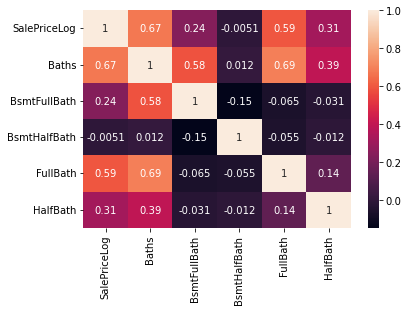

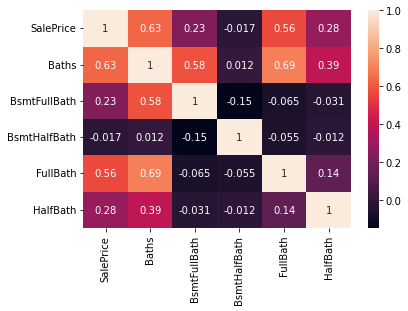

In [27]:
train_clean['Baths'] = train_clean['BsmtFullBath'] + train_clean['BsmtHalfBath']*.5 + train_clean['FullBath'] + train_clean['HalfBath']*.5

sn.heatmap(train_clean[['SalePriceLog', 'Baths', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath']].corr(), annot=True)
plt.show()
sn.heatmap(train_clean[['SalePrice', 'Baths', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath']].corr(), annot=True)
plt.show()

Currently there are three variables encompassing all of the square footage information. I create a single feature that captures all the square footage in a house plus garage. Most buyers look at aggregate square footage, not the individual square footage of the basement versus the area above grade (i.e. first floor and second floor). We can see that the new single variable ("TotSF") is .1/.11 more correlated to SalePrice/SalePriceLog than the previous highest square footage variable of the three.

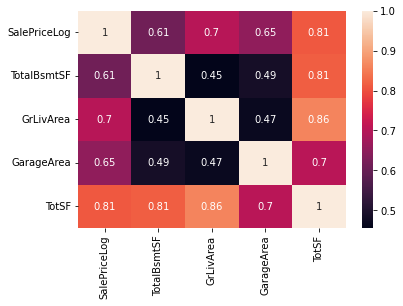

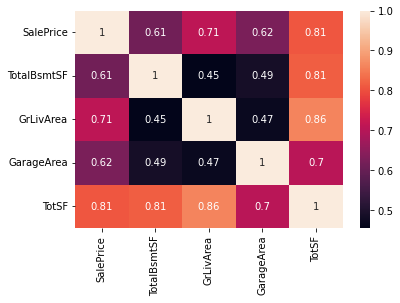

In [28]:
train_clean['TotSF'] = train_clean['TotalBsmtSF'] + train_clean['GrLivArea'] + train_clean['GarageArea']

sn.heatmap(train_clean[['SalePriceLog', 'TotalBsmtSF', 'GrLivArea', 'GarageArea', 'TotSF']].corr(), annot=True)
plt.show()
sn.heatmap(train_clean[['SalePrice', 'TotalBsmtSF', 'GrLivArea', 'GarageArea', 'TotSF']].corr(), annot=True)
plt.show()

Currently there are six variables encompassing all of the square footage information for outdoor porches and decks. I create a single feature that captures all the square footage for decks/porches. Most buyers look at aggregate square footage, not the individual square footage. We can see that the new single variable ("OutdoorSF") is .07 more correlated to SalePrice/SalePriceLog than the previous highest square footage variable of the six.

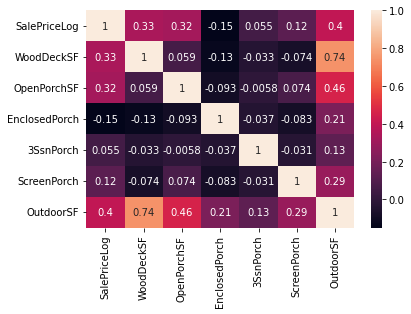

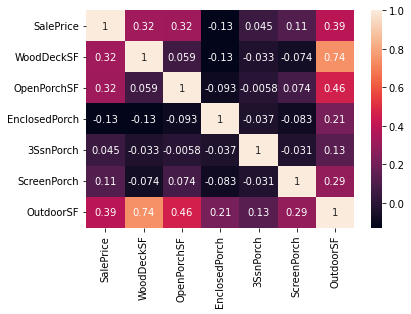

In [29]:
train_clean['OutdoorSF'] = train_clean['WoodDeckSF'] + train_clean['OpenPorchSF'] + train_clean['EnclosedPorch'] + train_clean['3SsnPorch'] + train_clean['ScreenPorch']

sn.heatmap(train_clean[['SalePriceLog', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'OutdoorSF']].corr(), annot=True)
plt.show()
sn.heatmap(train_clean[['SalePrice', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'OutdoorSF']].corr(), annot=True)
plt.show()

### Categorical data

The data set has independent variables that are categorical. We handle these by creating dummy variables (1/0) for each potential value a independent variable could take on. Later in the down selection of variables, I ensure to leave one option out to avoid collinearity. This means the interpretation of the coefficients of these dummy variables is the difference from the left-out option. 

In [30]:
cat_vars = ['BsmtFullBath', 'BsmtHalfBath', 'MoSold', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'YrSold',
            'GarageCars', 'MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Condition1', 'Neighborhood',
            'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 
            'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical',
            'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 
            'MiscFeature', 'SaleType', 'SaleCondition', 'GarageYrBlt']

In [31]:
y_train_clean = train_clean[['SalePrice', 'SalePriceLog']]

In [32]:
X_train_clean = train_clean.drop(['SalePrice', 'SalePriceLog'], axis = 1)

In [33]:
X_train_encoded = pd.get_dummies(data = X_train_clean, columns = cat_vars)

### Correlation heat map

I generate a large correlation mapping to see which variables seem to be likely predictors of SalePrice while keeping an eye on collinearity. 

Examining the heatmap results showing correlations between our independent variables and dependent variable (SalePrice), only a couple variables jump out as strong predictors of price (in either direction). OverallQual, YearBuilt, YearRemodAdd, TotSF, and Baths. All of these have a correlation of absolute value of .5 or higher. 

We see some interesting results when we look at the dummy variables that were generated from categorical variabes. We see that having a single full bath above grade is penalized while having two or more full baths is rewarded. We additionally see this starkly with the # of cars in a garage. 1 space is penalized, 2 spaces is assumed (correlation is almost 0) and 3 spaces has a correlation of .61. Looking at Fireplaces, housing styles, roof style, exterior, central air, heating, kitchen quality, garage type, garage finish, sale type, and garage year built we see similar patterns where having a certain type of feature is rewarded, others are penalized, and some types have no impact on price. 

#### Heat map results

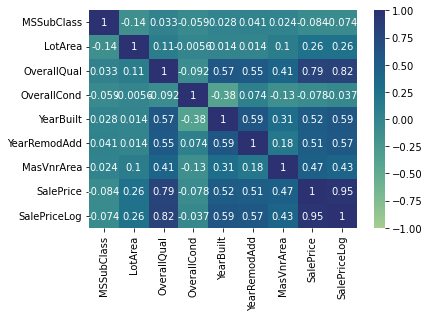

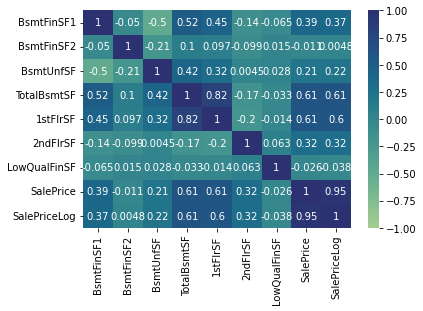

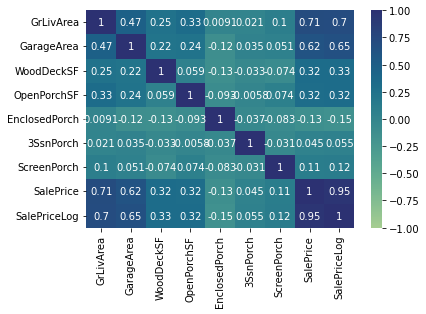

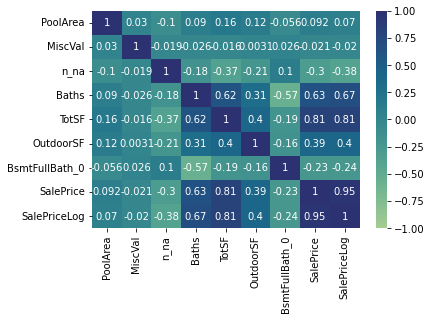

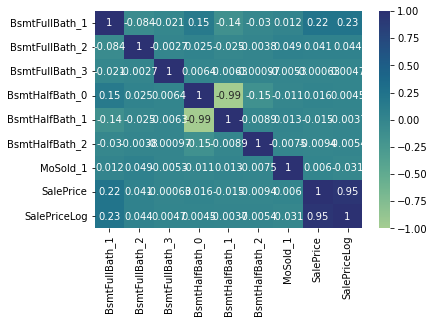

...

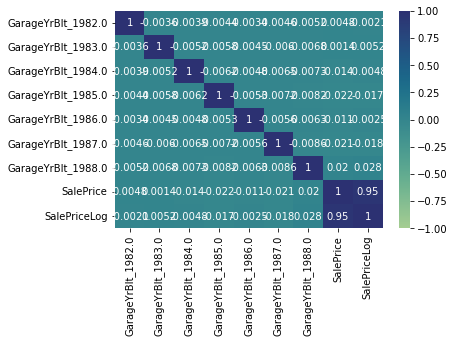

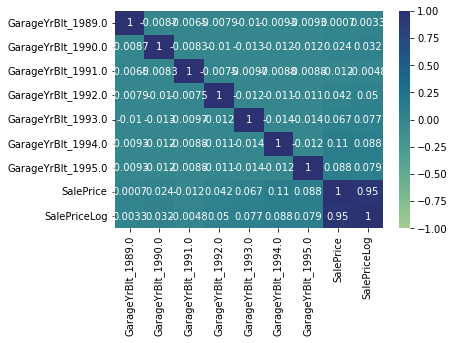

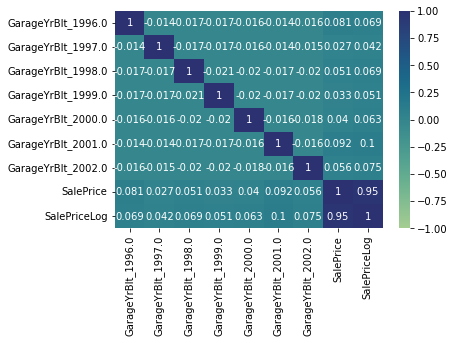

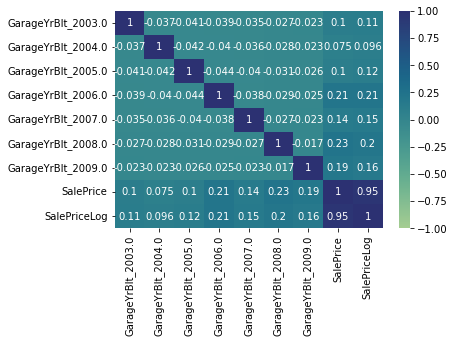

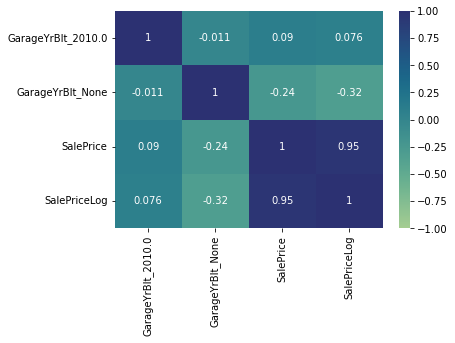

In [34]:
for i in range(0, len(X_train_encoded), 7):
    last = i + 7
    temp1 = X_train_encoded.iloc[:, i:last].merge(y_train_clean, how='inner', left_index=True, right_index=True)
    if len(temp1.columns) == 2:
        break
    sn.heatmap(temp1.corr(), vmin = -1, vmax = 1, annot=True, cmap = 'crest')
    plt.show()

### Correlation heat map - subset of variables

I plot the correlation heat map of the subset of variables that show a relationship with SalePrice to determine collinearity visually before building the models. I also ensure that any of the dummy variables are missing at least one of its associated dummy variables to ensure no collinearity. 

I have to remove the following variables since they were too closely correlated with another variable but had a lower absolute value correlation with SalePrice:
* SaleType_WD
* SaleCondition_Partial
* KitchenQual_Gd
* RoofStyle_Gable
* MSZoning_RL
* FireplaceQu_None
* GarageFinish_None
* GarageYrBlt_None
* GarageType_Attchd
* FullBath_2

#### Heat map results

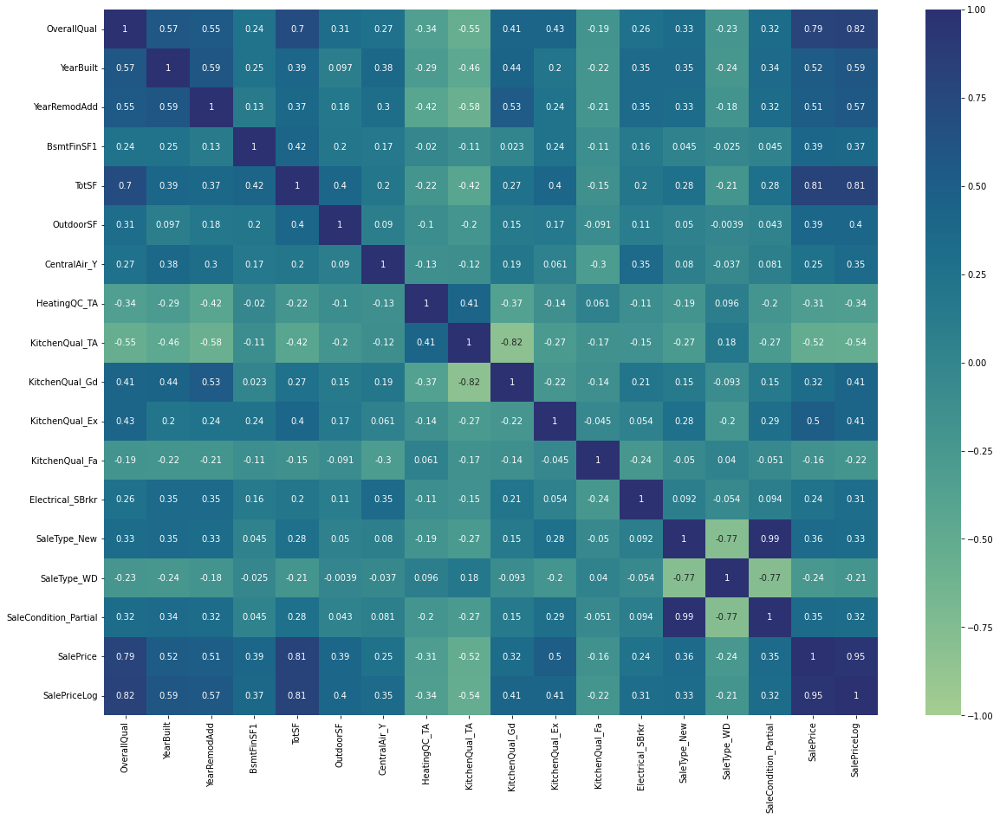

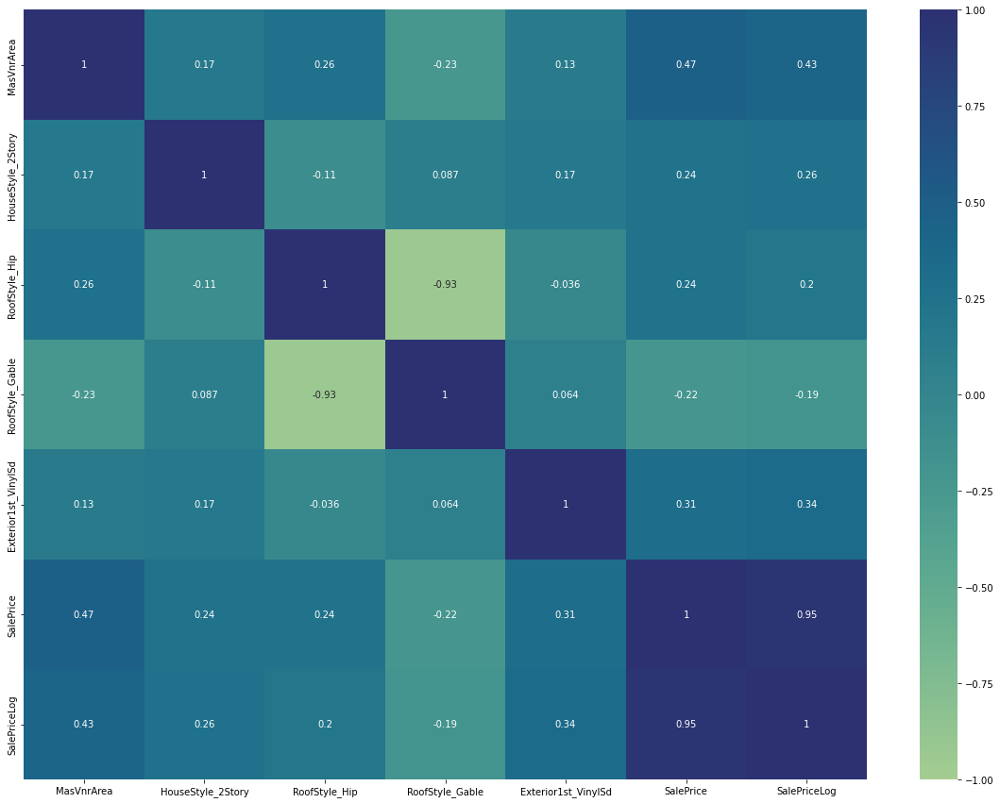

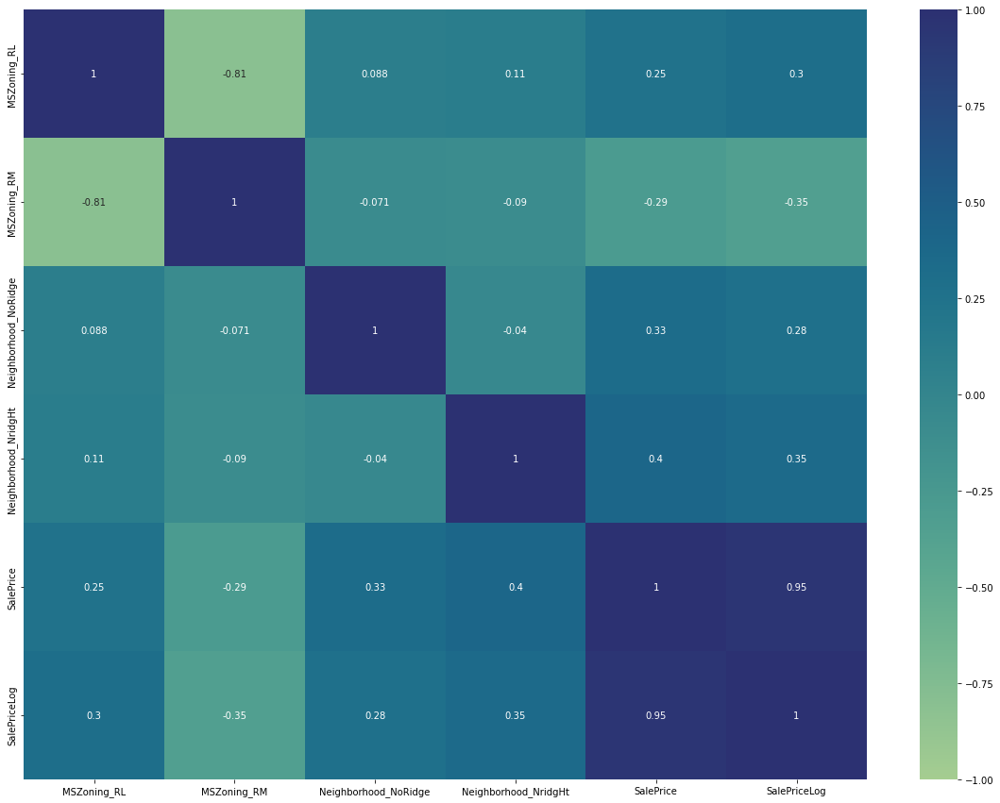

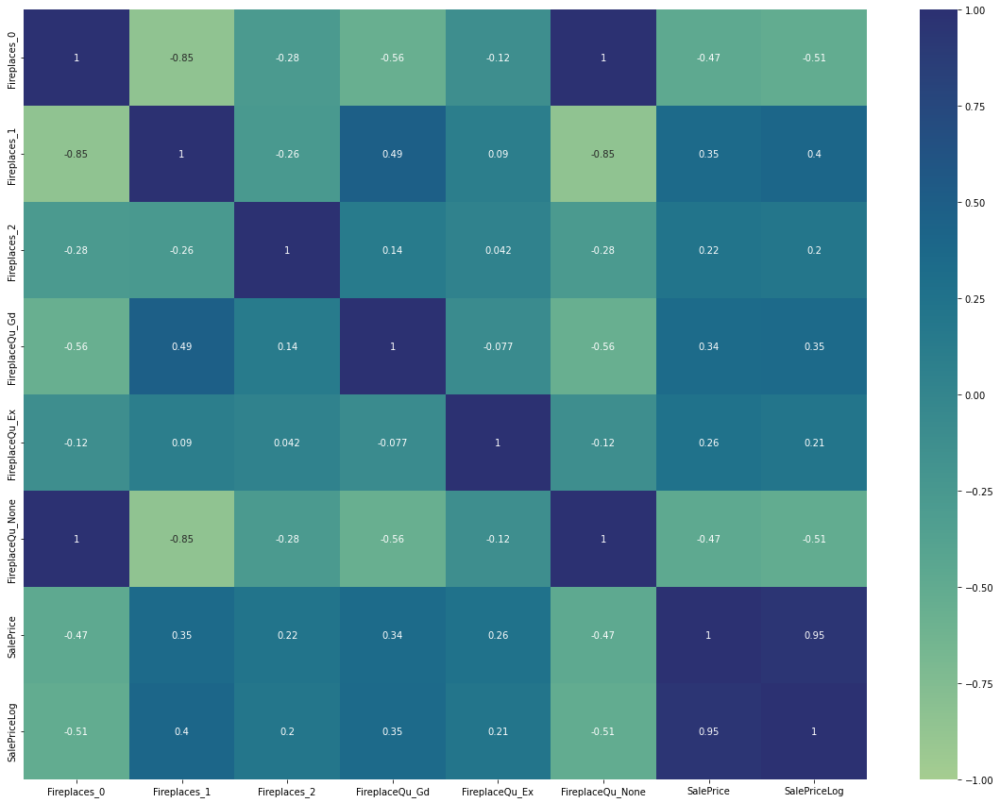

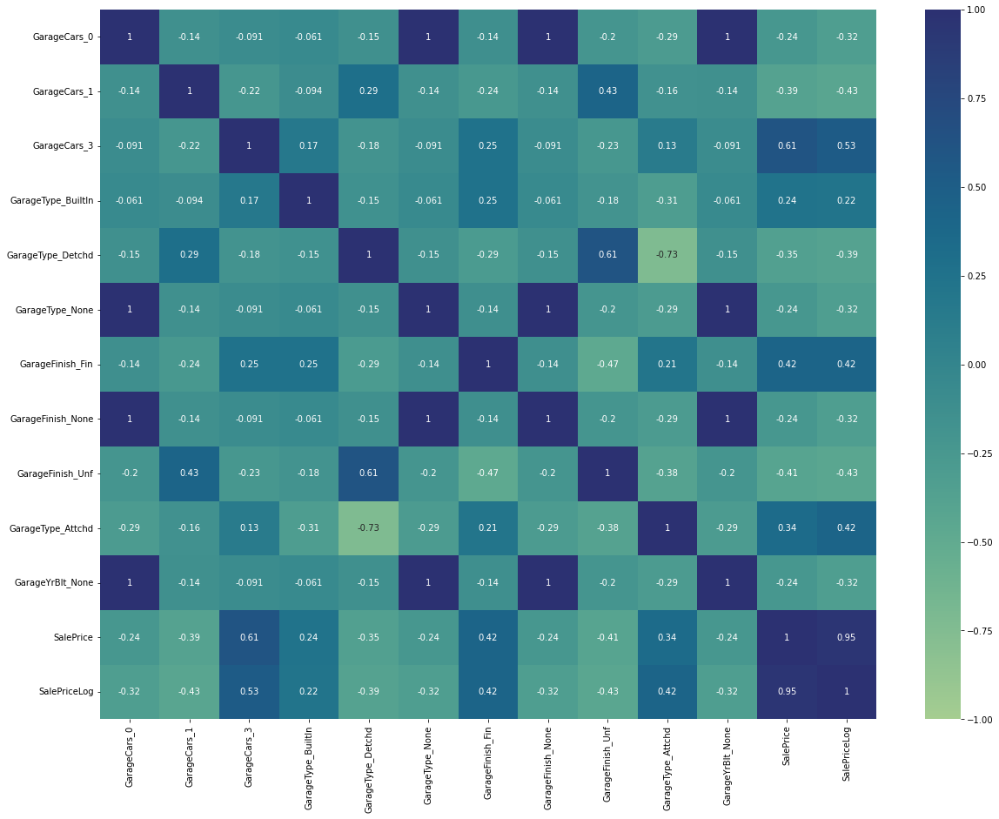

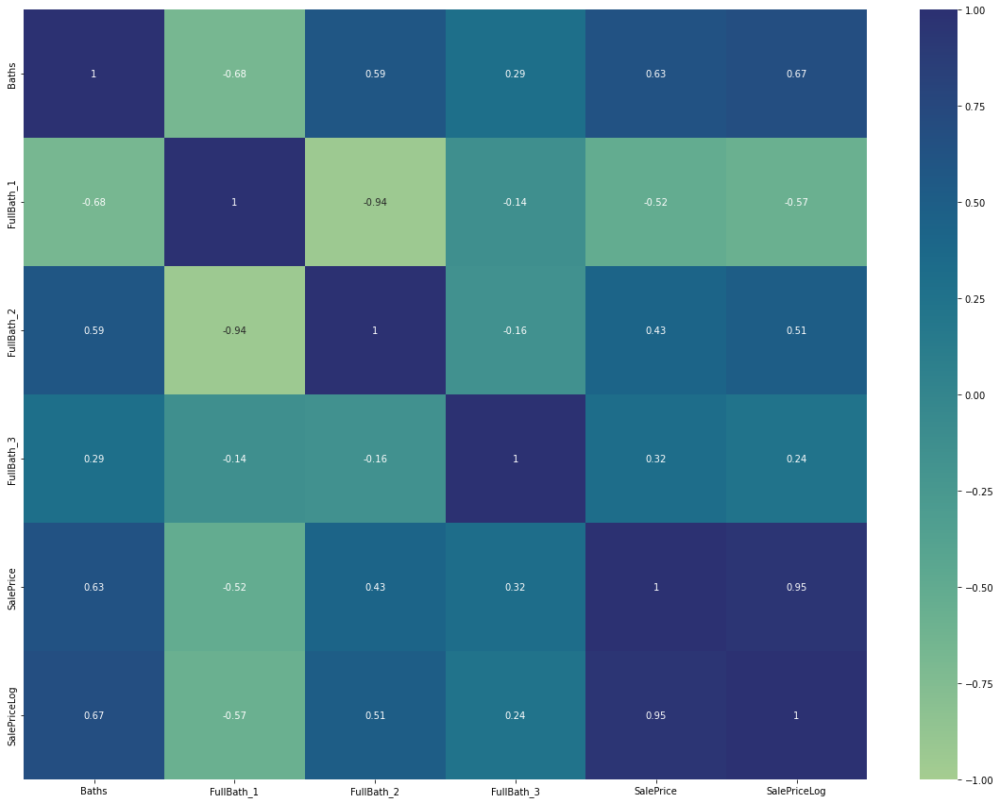

In [35]:
general_vars = ['OverallQual', 'YearBuilt', 'YearRemodAdd',  'BsmtFinSF1', 'TotSF',  'OutdoorSF', 'CentralAir_Y', 'HeatingQC_TA', 'KitchenQual_TA', 'KitchenQual_Gd', 
                'KitchenQual_Ex', 'KitchenQual_Fa', 'Electrical_SBrkr', 'SaleType_New', 'SaleType_WD', 'SaleCondition_Partial']
exterior_vars = ['MasVnrArea', 'HouseStyle_2Story', 'RoofStyle_Hip', 'RoofStyle_Gable', 'Exterior1st_VinylSd']
place_vars = ['MSZoning_RL', 'MSZoning_RM', 'Neighborhood_NoRidge', 'Neighborhood_NridgHt']
fireplace_vars = ['Fireplaces_0', 'Fireplaces_1', 'Fireplaces_2', 'FireplaceQu_Gd', 'FireplaceQu_Ex', 'FireplaceQu_None']
garage_vars = ['GarageCars_0', 'GarageCars_1', 'GarageCars_3', 'GarageType_BuiltIn', 'GarageType_Detchd', 'GarageType_None', 'GarageFinish_Fin', 'GarageFinish_None', 'GarageFinish_Unf', 
               'GarageType_Attchd', 'GarageYrBlt_None']
bathroom_vars = ['Baths', 'FullBath_1', 'FullBath_2', 'FullBath_3']

for i in [general_vars, exterior_vars, place_vars, fireplace_vars, garage_vars, bathroom_vars]:
    temp1 = X_train_encoded[i]
    temp2 = temp1.merge(y_train_clean, how='inner', left_index=True, right_index=True)
    if len(temp2.columns) == 2:
        break
    plt.subplots(figsize=(20,15))
    sn.heatmap(temp2.corr(), vmin = -1, vmax = 1, annot=True, cmap = 'crest')
    plt.show()

#### Final feature selection prior to modeling

In [36]:
X_train_encoded = X_train_encoded[['OverallQual', 'YearBuilt', 'YearRemodAdd',  'BsmtFinSF1', 'TotSF',  'OutdoorSF', 'CentralAir_Y', 'HeatingQC_TA', 'KitchenQual_TA', 
                                   'KitchenQual_Gd', 'KitchenQual_Ex', 'KitchenQual_Fa', 'Electrical_SBrkr', 'SaleType_New', 'SaleType_WD', 'SaleCondition_Partial', 
                                   'MasVnrArea', 'HouseStyle_2Story', 'RoofStyle_Hip', 'RoofStyle_Gable', 'Exterior1st_VinylSd','MSZoning_RL', 'MSZoning_RM', 
                                   'Neighborhood_NoRidge', 'Neighborhood_NridgHt', 'Fireplaces_0', 'Fireplaces_1', 'Fireplaces_2', 'FireplaceQu_Gd', 'FireplaceQu_Ex', 
                                   'FireplaceQu_None', 'GarageCars_0', 'GarageCars_1', 'GarageCars_3', 'GarageType_BuiltIn', 'GarageType_Detchd', 'GarageType_None', 
                                   'GarageFinish_Fin', 'GarageFinish_None', 'GarageFinish_Unf', 'GarageType_Attchd', 'GarageYrBlt_None', 'Baths', 'FullBath_1', 
                                   'FullBath_2', 'FullBath_3']]

In [37]:
X_train_encoded.drop(['SaleType_WD','SaleCondition_Partial','KitchenQual_Gd','RoofStyle_Gable','MSZoning_RL', 'FireplaceQu_None',
                      'GarageFinish_None','GarageYrBlt_None','GarageType_Attchd','FullBath_2'], 
                     axis = 1, 
                     inplace = True)

## Modeling

I generate two different models. The first is a linear model and the second is a linear model that has nonlinear components.

I first scale the variables that will be potentially used in the model. For the models with nonlinear components, I will evaluate polynomial, indicator, and piecewise model components. Thus, I end up with one version of Model A (linear with no non-linear components) and three versions of Model B (linear with non-linear components).

After the models are generated, I will check each of the models first for fit using R^2 and the F Statistic. Once I am satisfied that the grouping of independent variables have predictive power, I then check for collinearity using variance inflation factor, outliers using studentized residuals, high-leverage points using the leverage statistic. With each modification, I rerun R^2 and F statistic to track the progress of fit. 

Lastly, I then evaluate the assumptions of the model. I evaluate how each of the models satisfy (or not) linearity of the response-predictor relationships, uncorrelation of error terms, and constant variance of error terms. I make any last adjustments to the models before evaluating the fit one last time.

Once I am satisfied that the models meet the necessary criteria, I then use cross-validation (k=10) to check that I did not over-fit the model prior to running the models against the validation set. The validation set will help determine which models have been over-fit that the cross-validation didn't find and additionally inform if certain models outperform their peers.

### Scaling

I consider two options for scaling, either Min-Max or Standard. Since we have a large amount of categorical variables that were transformed into dummy variables, I choose Min-Max scaling. This allows me to include robustness to very small standard deviations of features and preserving zero entries in sparse data.

In [38]:
min_max_scaler_y = MinMaxScaler()
min_max_scaler_y_log = MinMaxScaler()
min_max_scaler_x = MinMaxScaler()

X_train_scaled = min_max_scaler_x.fit_transform(X_train_encoded)
y_train_scaled_log = min_max_scaler_y_log.fit_transform(y_train_clean[['SalePriceLog']])
y_train_scaled_normal = min_max_scaler_y.fit_transform(y_train_clean[['SalePrice']])

### Model A

In Model A I use SalePriceLog as the target feature as discussed above. Additionally, I won't be including any non-linear components in this model so the log transformation will help my accuracy since I shifted the dependent variable's distribution to be more normal.

#### Split between train and validation sets

In [39]:
X_train_a, X_test_a, y_train_a, y_test_a = train_test_split(X_train_scaled, y_train_scaled_log, test_size=0.3, random_state=0)

#### Model development

First attempt uses all the potential variables. While the Adj. R^2 is high and so  is the F-stat, we see we have some non-significant coefficients and multicollinearity. Second attempt removes the non-significant coefficients.

In [40]:
X_train_a_1 = sm.add_constant(X_train_a)
model_a_1_est = sm.OLS(y_train_a, X_train_a_1)
model_a_1 = model_a_1_est.fit()
print(model_a_1.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.873
Model:                            OLS   Adj. R-squared:                  0.869
Method:                 Least Squares   F-statistic:                     194.5
Date:                Sun, 16 Jan 2022   Prob (F-statistic):               0.00
Time:                        07:53:52   Log-Likelihood:                 1685.6
No. Observations:                1022   AIC:                            -3299.
Df Residuals:                     986   BIC:                            -3122.
Df Model:                          35                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.1703      0.033      5.155      0.0

Our R^2 went down a little but our F-stat went up. Getting rid of non-significant variables improved the significance of the model but lowered the accuracy meaning there was some explanatory power collectively in the 22 variables that were dropped.

Now we run outlier test, leverage test, and collinearity test to test the linear assumption and check that observation's aren't unduly influence the regression line.

To check outliers, calculate the studentized residuals and to check for leverage I calculate the leverage statistic. Studentized residuals should be below the absolute value of three and the leverage statistic should be below (2k+2)/n. I plot both of these together to get a sense of the influence of certain observations. The influence factor is how large the point on the scatter plot is and is Cook's Distance measure. To check for collinearity, I calculate the variance inflation factor. If a VIF value exceeds 5 or 10, it indicates collinearity. 

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.814
Model:                            OLS   Adj. R-squared:                  0.812
Method:                 Least Squares   F-statistic:                     339.3
Date:                Sun, 16 Jan 2022   Prob (F-statistic):               0.00
Time:                        07:53:54   Log-Likelihood:                 1488.6
No. Observations:                1022   AIC:                            -2949.
Df Residuals:                    1008   BIC:                            -2880.
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.1706      0.012     14.363      0.0

/home/jhancuch/miniconda3/lib/python3.9/site-packages/statsmodels/stats/outliers_influence.py:195: RuntimeWarning: divide by zero encountered in double_scalars
  vif = 1. / (1. - r_squared_i)


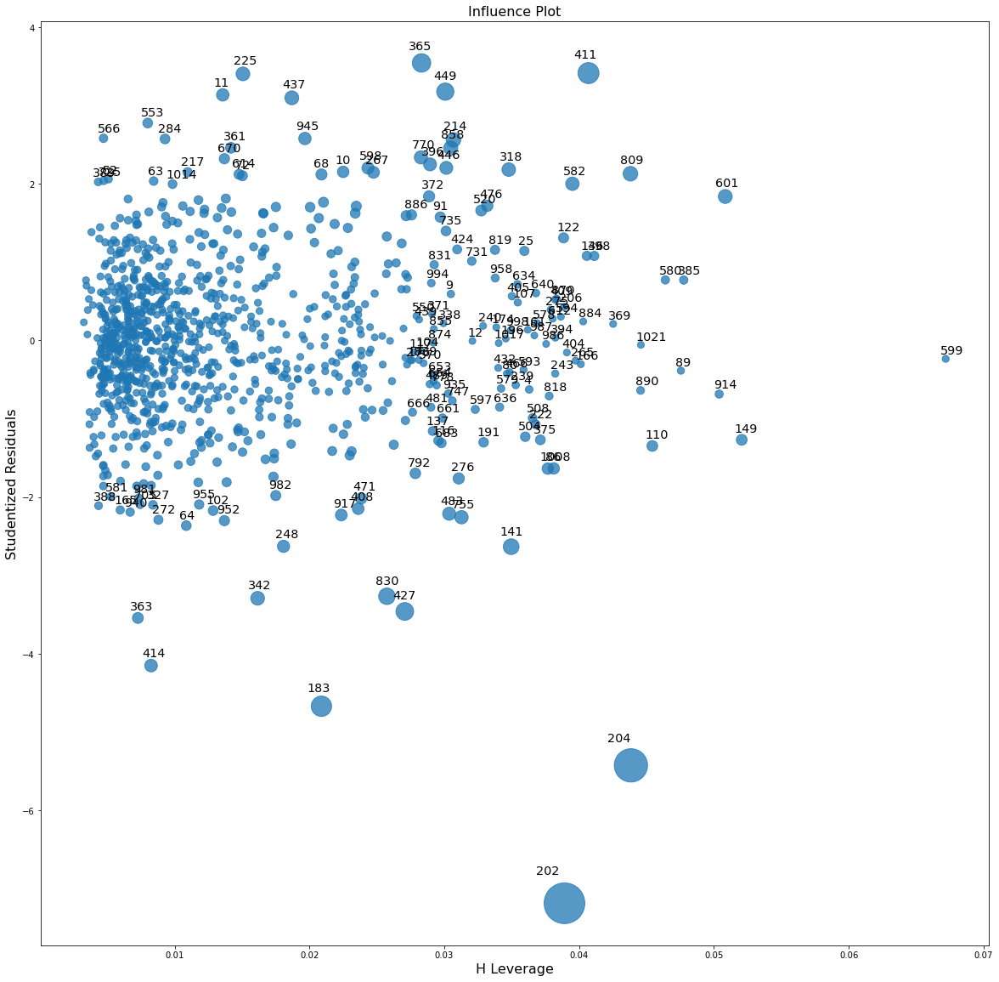

In [41]:
X_train_2 = np.delete(X_train_a, [1, 4, 10, 11, 13, 14, 15, 16, 19, 20, 21, 22, 23, 24, 26, 27, 28, 29, 31, 32, 34, 35], axis = 1)

X_train_a_2 = sm.add_constant(X_train_2)
model_a_2_est = sm.OLS(y_train_a, X_train_a_2)
model_a_2 = model_a_2_est.fit()
print(model_a_2.summary())

model_analysis(model_a_2, X_train_2)

We drop the variables that have a high influence which are observations that have both a high leverage score and a high studentized residual score. By only dropping observations that fall within both of these categories, we reduce the possibility of the model over-fitting to this single training set. 

We additionally drop the two variables that are insignificant and rerun the model.

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.807
Model:                            OLS   Adj. R-squared:                  0.804
Method:                 Least Squares   F-statistic:                     349.6
Date:                Sun, 16 Jan 2022   Prob (F-statistic):               0.00
Time:                        07:53:57   Log-Likelihood:                 1469.7
No. Observations:                1018   AIC:                            -2913.
Df Residuals:                    1005   BIC:                            -2849.
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.1641      0.012     13.605      0.0

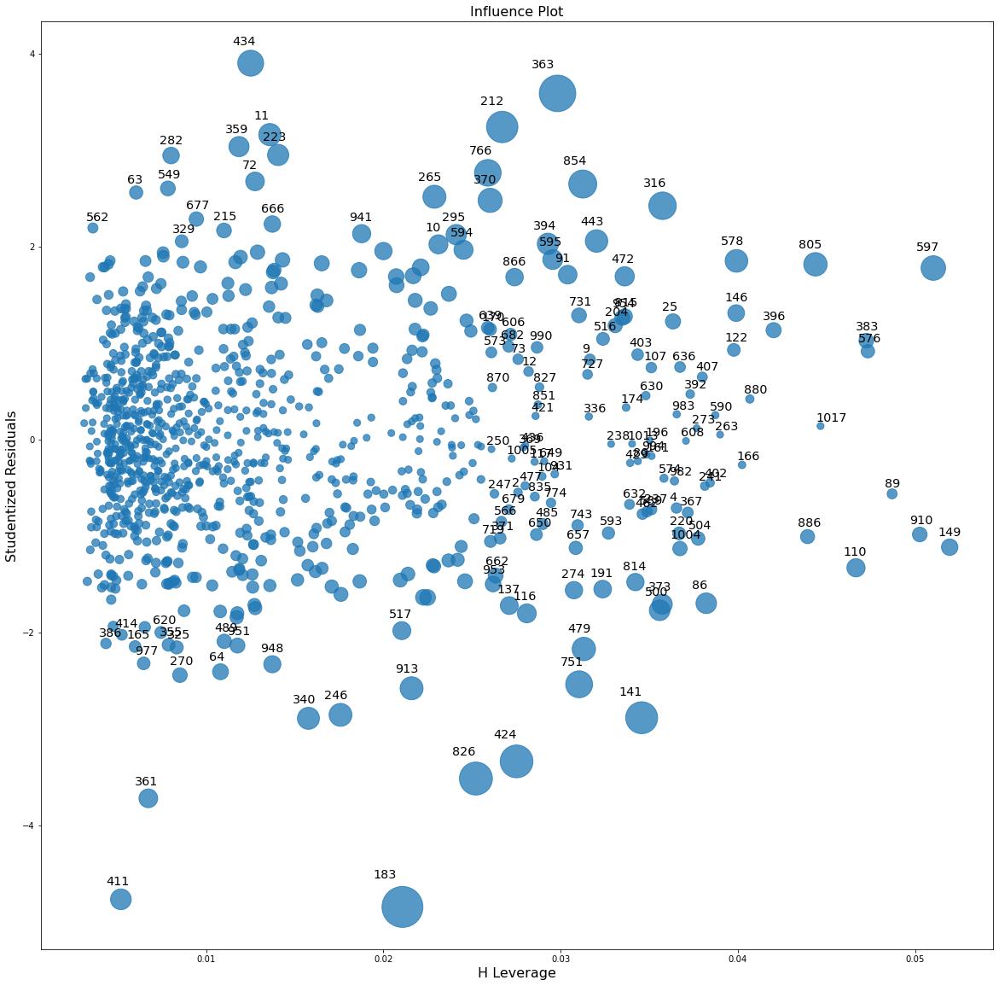

In [42]:
X_train_3 = np.delete(X_train_2, [12, 13], axis = 1)
X_train_3 = np.delete(X_train_3, [202, 204, 411, 449], axis = 0)
y_train_a_3 = np.delete(y_train_a, [202, 204, 411, 449], axis = 0)

X_train_a_3 = sm.add_constant(X_train_3)
model_a_3_est = sm.OLS(y_train_a_3, X_train_a_3)
model_a_3 = model_a_3_est.fit()
print(model_a_3.summary())

model_analysis(model_a_3, X_train_3)

While our adjusted R^2 continues to drop a little with each removal of observations and variables, it is not enough to worry me. It is okay to have a lower accuracy if it shows that the model is more generalizable and thus will perform better against the test set. 

We once again compute our leverage, outlier, and VIF scores and drop the observations that are above the threshold for both outliers and leverage. We rerun the model again.

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.812
Model:                            OLS   Adj. R-squared:                  0.810
Method:                 Least Squares   F-statistic:                     360.9
Date:                Sun, 16 Jan 2022   Prob (F-statistic):               0.00
Time:                        07:54:06   Log-Likelihood:                 1491.3
No. Observations:                1014   AIC:                            -2957.
Df Residuals:                    1001   BIC:                            -2893.
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.1714      0.012     14.346      0.0

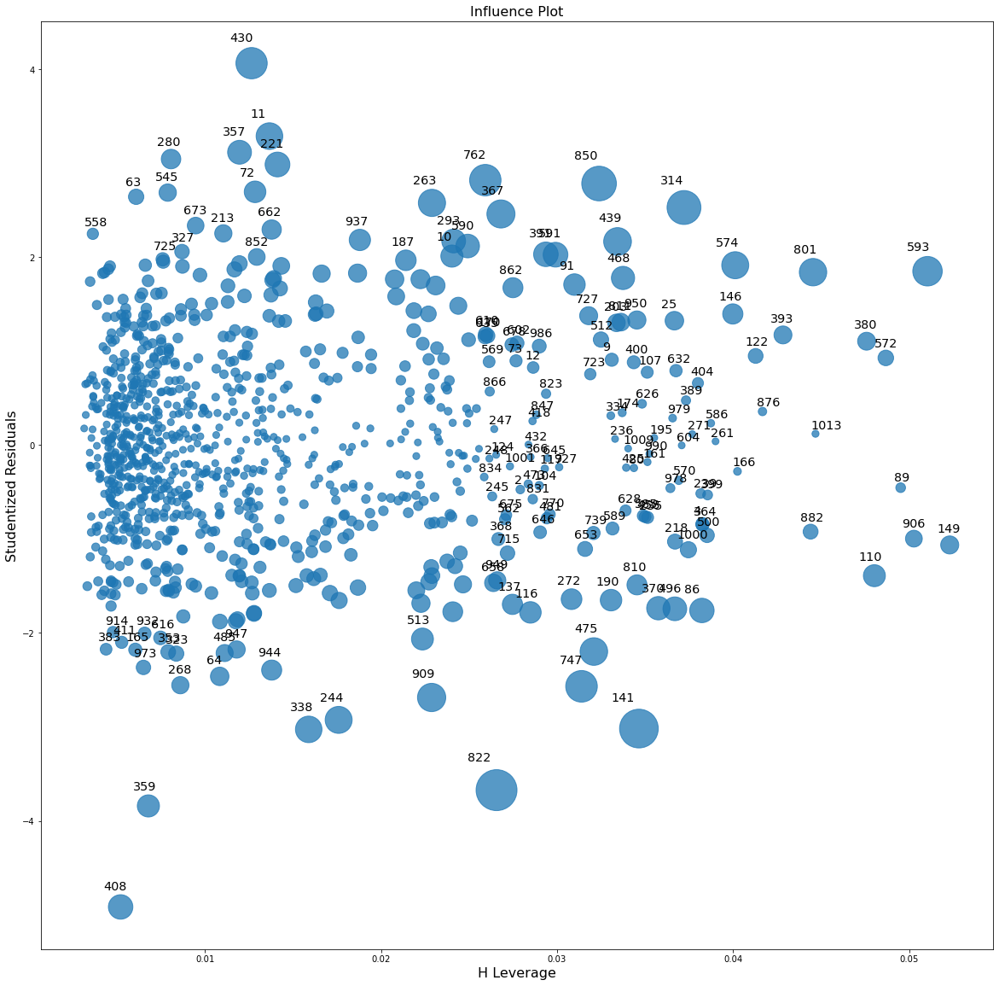

In [43]:
X_train_a_4 = np.delete(X_train_3, [212, 363, 424, 183], axis = 0)
y_train_a_4 = np.delete(y_train_a_3, [212, 363, 424, 183], axis = 0)

X_train_a_4_const = sm.add_constant(X_train_a_4)
model_a_4_est = sm.OLS(y_train_a_4, X_train_a_4_const)
model_a_4 = model_a_4_est.fit()
print(model_a_4.summary())

model_analysis(model_a_4, X_train_a_4)

Our R^2 actually went up showing how dropping outliers and high leverage points can help improve the fit of the regression line. Since there are no longer any observations that are both outliers and have high leverage, I now check that our linear model meets the three assumptions: Linear response-predictor relationship, non-correlated error terms, and homoskedastic error terms.

In the plots below, for each variable we focus on the top right graph. For the linear response-predictor relationship we expect to see a random scatter plot and not be able to detect a trend. For non-correlated error terms, we expect to see that the points before and after are not-correlated. If they are correlated, it should be a smooth chart as the points are correlated. For homoskedastic error terms, we expect there to be a constant variance. If we see a cone shape of the residuals as they spread out, this is an indicator that the error terms are not homoskedastic.

For this model, I find that all the assumptions are met. 

eval_env: 1
eval_env: 1
eval_env: 1
eval_env: 1
eval_env: 1
eval_env: 1
eval_env: 1
eval_env: 1
eval_env: 1
eval_env: 1
eval_env: 1
eval_env: 1


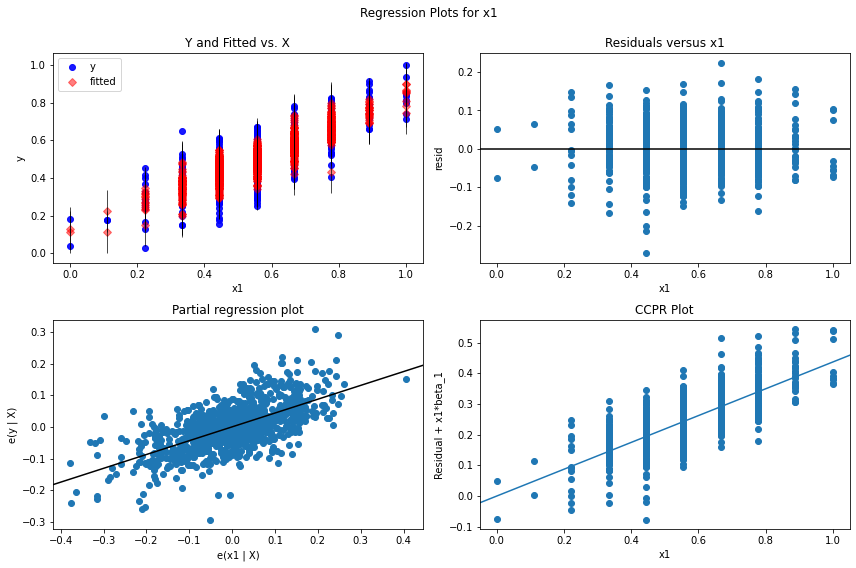

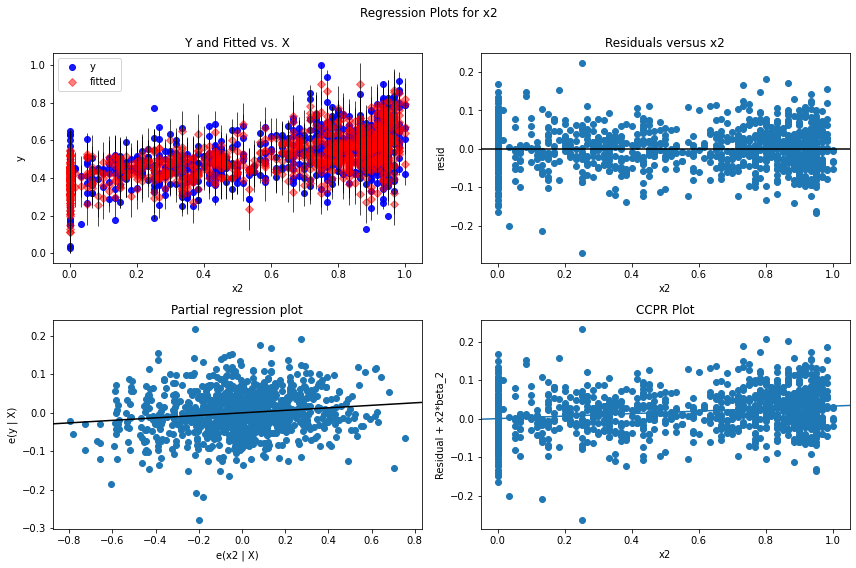

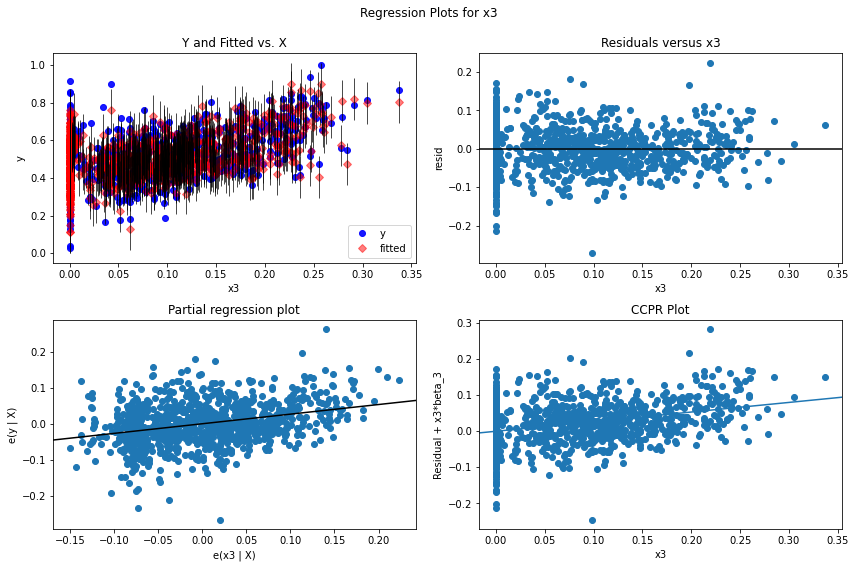

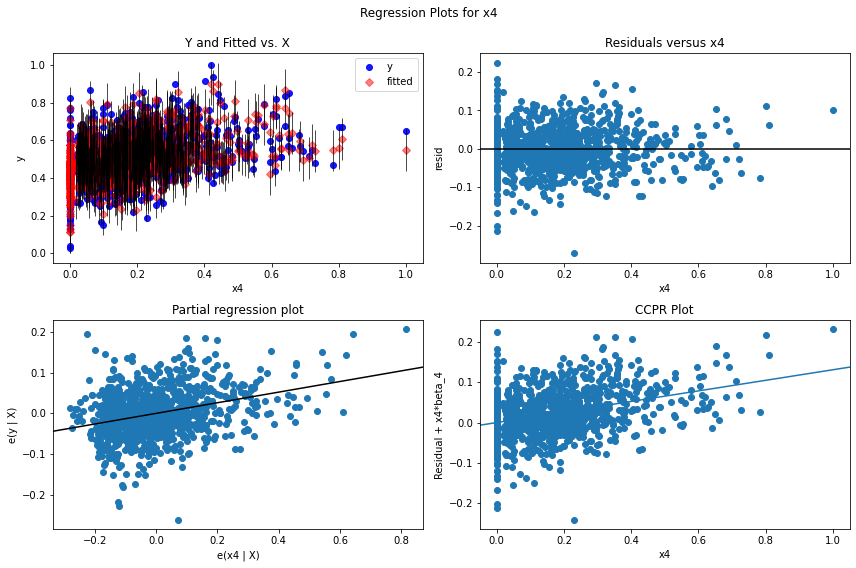

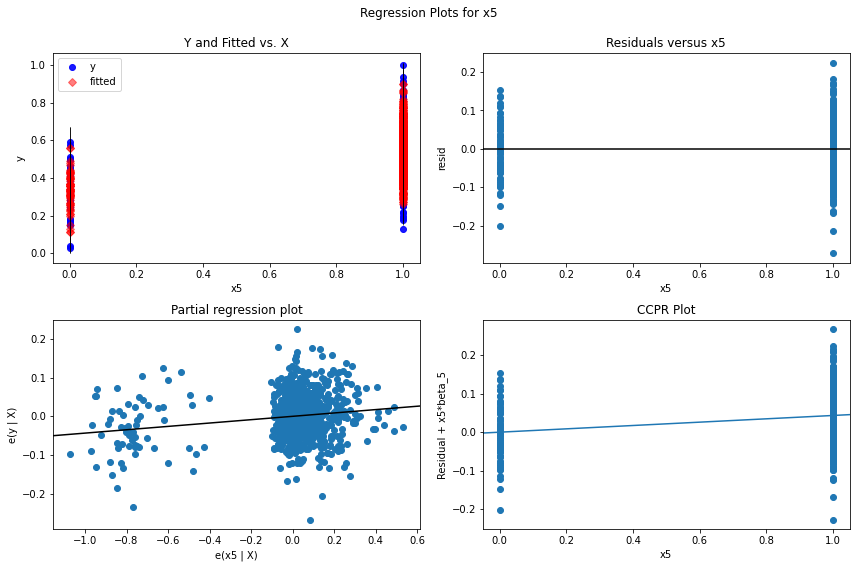

...

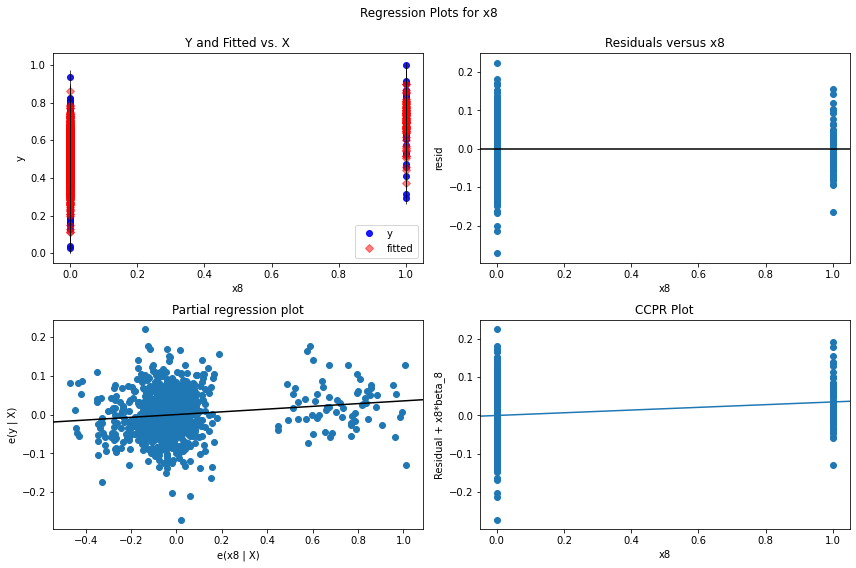

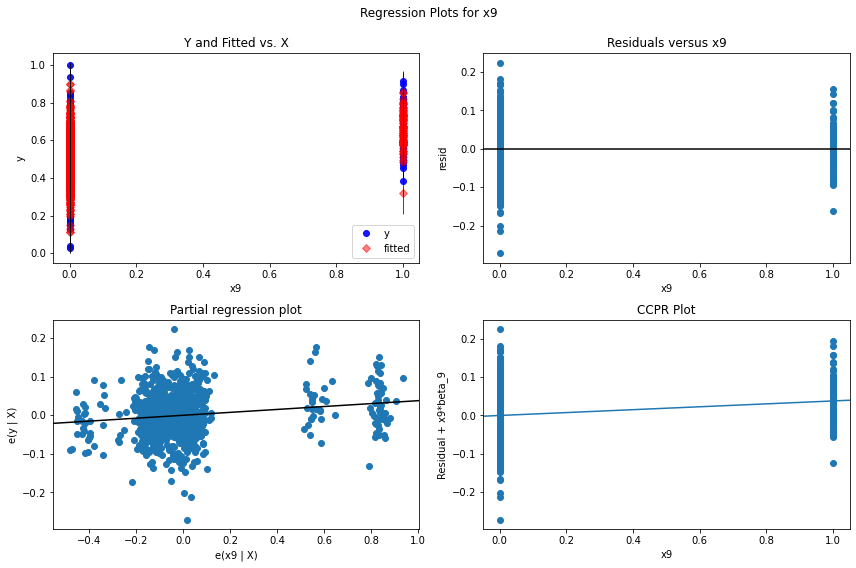

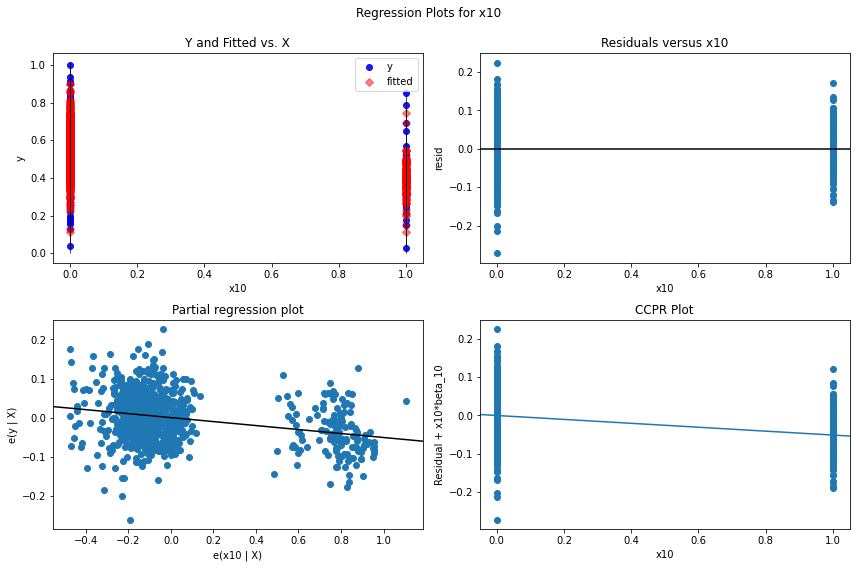

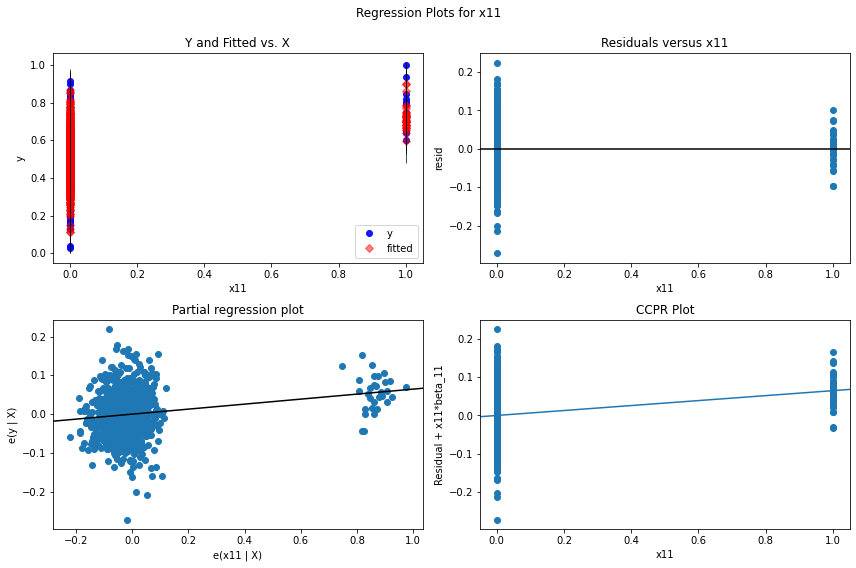

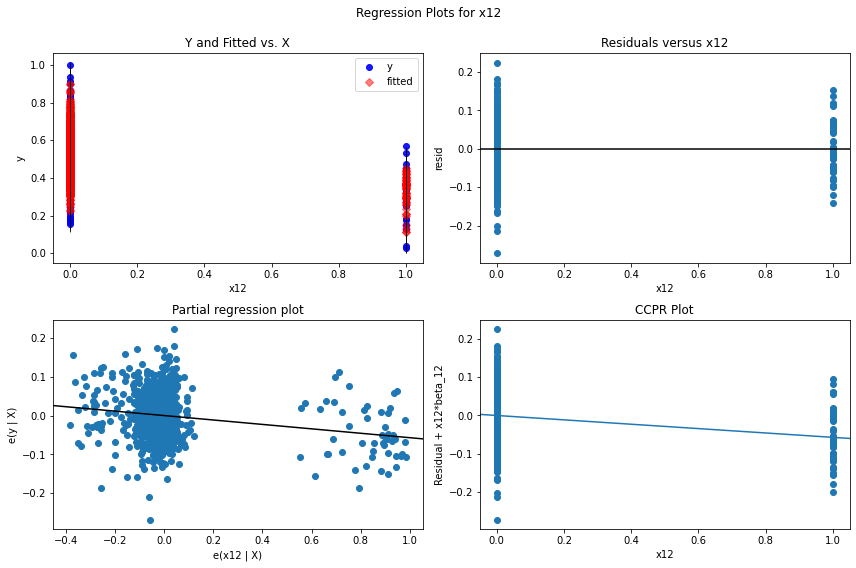

In [44]:
assumptions(model_a_4, len(X_train_a_4[0]))

Since I am satisfied with where the model is, I now switch to sklearn to conduct cross-validation. I prefer statsmodel's OLS regression when developing since I can easily get coefficients and p scores. However, sklearn provides cross-validation procedures and is easier to handle predictions.

I generate a mean R^2 of .8 with a standard deviation of .03. While the R^2 is lower than when we were developing the model, this is expected. With a standard deviation of .03, it shows the model isn't over-fitted.

In [46]:
linear_reg = LinearRegression()
model_a_scores = cross_val_score(linear_reg, X_train_a_4, y_train_a_4, cv=10)
print("Scores:", model_a_scores)
print("Mean:", model_a_scores.mean())
print("Standard deviation:", model_a_scores.std())

Scores: [0.76147508 0.84366142 0.78152728 0.81456395 0.78516571 0.82125455
 0.79085672 0.84252161 0.78333008 0.78097991]
Mean: 0.8005336312897955
Standard deviation: 0.02672852499057226


### Model B

For Model B, I use the SalePrice as the feature target since I am incorporating non-linear components on the right hand side of the equation. Additionally, since I tackle including polynomials, indicator functions, and piecewise polynomials, I end up with three versions of Model B.

#### Split between train and validation sets

In [48]:
X_train_b, X_test_b, y_train_b, y_test_b = train_test_split(X_train_scaled, y_train_scaled_normal, test_size=0.3, random_state=0)

#### Polynomial

There are two variables still in the data set that show a non-linear relationship with SalePrice. These are YearBuilt and YearRemodAdd. Looking back at the scatter plots with the independent variables on the x axis and SalePrice on the Y axis we see that these appear to have a relationship similar to x^2 (YearBuilt) and x^3 (YearRemodAdd). Thus I add these transformed variables to the training set

In [49]:
squared = np.array(X_train_b[:, 1] ** 2)
cubed = np.array(X_train_b[:, 2] ** 3)

X_train_b_poly = np.column_stack([X_train_b, squared])
X_train_b_poly = np.column_stack([X_train_b_poly, cubed])

In [50]:
X_train_b_poly_1 = sm.add_constant(X_train_b_poly)
model_b_poly_1_est = sm.OLS(y_train_b, X_train_b_poly_1)
model_b_poly_1 = model_b_poly_1_est.fit()
print(model_b_poly_1.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.864
Model:                            OLS   Adj. R-squared:                  0.859
Method:                 Least Squares   F-statistic:                     168.5
Date:                Sun, 16 Jan 2022   Prob (F-statistic):               0.00
Time:                        07:54:25   Log-Likelihood:                 1838.5
No. Observations:                1022   AIC:                            -3601.
Df Residuals:                     984   BIC:                            -3414.
Df Model:                          37                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0656      0.032     -2.055      0.0

We see the R^2 is much higher than the linear model with no non-linear components which is promising. There are non-significant variables so I drop those and rerun the model. 

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.858
Model:                            OLS   Adj. R-squared:                  0.855
Method:                 Least Squares   F-statistic:                     301.7
Date:                Sun, 16 Jan 2022   Prob (F-statistic):               0.00
Time:                        07:54:26   Log-Likelihood:                 1816.5
No. Observations:                1022   AIC:                            -3591.
Df Residuals:                    1001   BIC:                            -3487.
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0956      0.016     -6.112      0.0

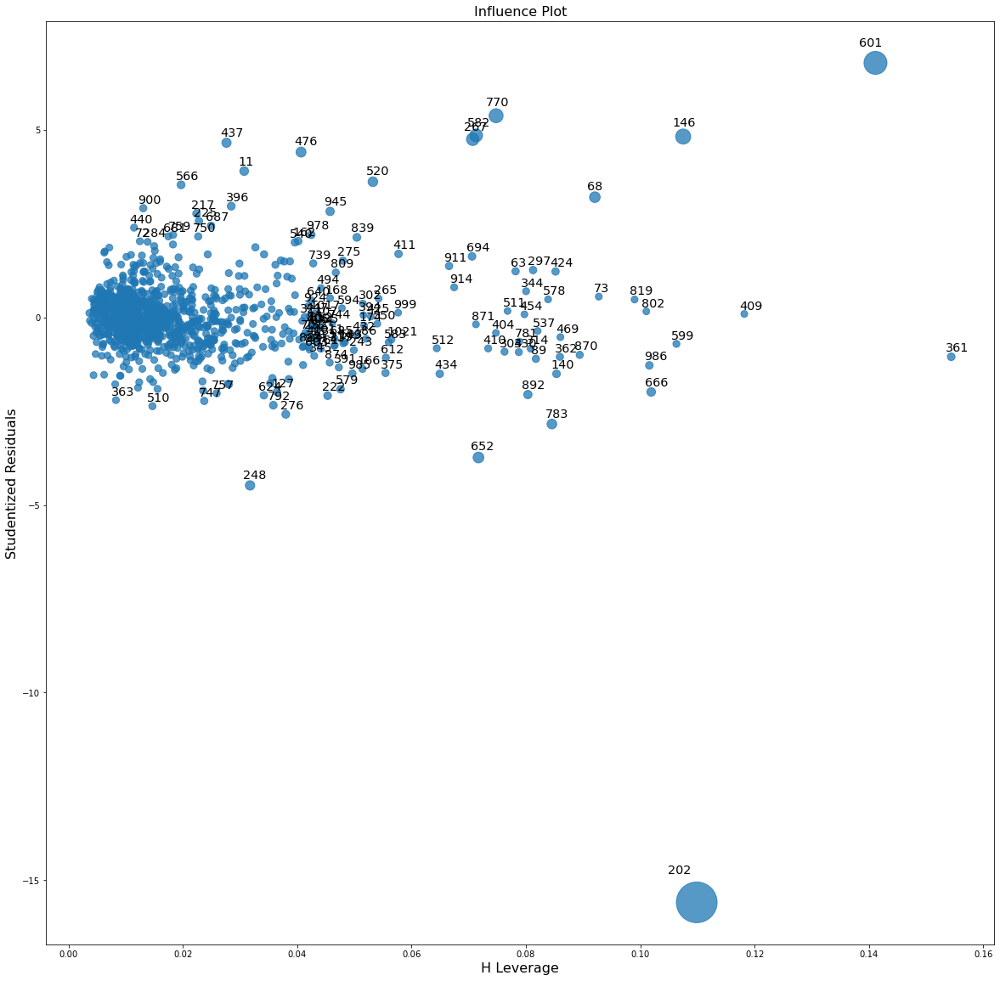

In [51]:
X_train_b_poly_2 = np.delete(X_train_b_poly, [2, 6, 7, 10, 11, 15, 16, 20, 21, 22, 23, 25, 26, 28, 29, 30, 32, 34], axis = 1)

X_train_b_poly_2_const = sm.add_constant(X_train_b_poly_2)
model_b_poly_2_est = sm.OLS(y_train_b, X_train_b_poly_2_const)
model_b_poly_2 = model_b_poly_2_est.fit()
print(model_b_poly_2.summary())

model_analysis(model_b_poly_2, X_train_b_poly_2)

The R^2 drops slightly but the f-statistic goes up which is promising. I now tackle observations that have high leverage and are outliers by dropping them.

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.888
Model:                            OLS   Adj. R-squared:                  0.885
Method:                 Least Squares   F-statistic:                     392.0
Date:                Sun, 16 Jan 2022   Prob (F-statistic):               0.00
Time:                        07:54:34   Log-Likelihood:                 2013.7
No. Observations:                1013   AIC:                            -3985.
Df Residuals:                     992   BIC:                            -3882.
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.1016      0.013     -7.997      0.0

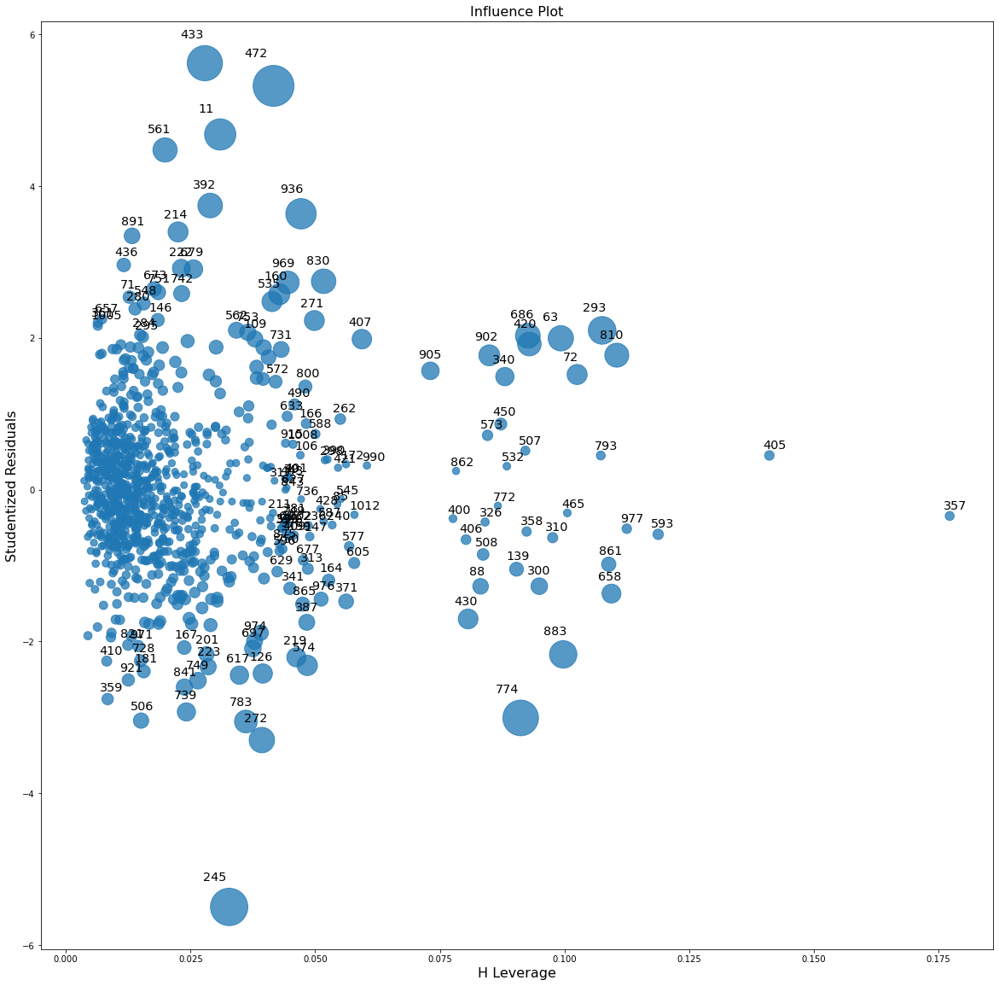

In [52]:
X_train_b_poly_3 = np.delete(X_train_b_poly_2, [68, 146, 202, 267, 520, 582, 601, 652, 770], axis = 0)
y_train_b_poly_3 = np.delete(y_train_b, [68, 146, 202, 267, 520, 582, 601, 652, 770], axis = 0)

X_train_b_poly_3_const = sm.add_constant(X_train_b_poly_3)
model_b_poly_3_est = sm.OLS(y_train_b_poly_3, X_train_b_poly_3_const)
model_b_poly_3 = model_b_poly_3_est.fit()
print(model_b_poly_3.summary())

model_analysis(model_b_poly_3, X_train_b_poly_3)

Our R^2 goes up, showing that the outliers and high leverage points had a undesired effect on the regression line. We now see that we still have one variable that has an insignificant coefficient. I drop that variable and rerun the model. We see that the VIF scores are high for the constant and then the relationship between the untransformed variables and their transformed variables. I don't drop any since it is expected that the transformed variables and untransformed versions would be closely related.

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.888
Model:                            OLS   Adj. R-squared:                  0.885
Method:                 Least Squares   F-statistic:                     412.7
Date:                Sun, 16 Jan 2022   Prob (F-statistic):               0.00
Time:                        07:54:39   Log-Likelihood:                 2013.3
No. Observations:                1013   AIC:                            -3987.
Df Residuals:                     993   BIC:                            -3888.
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.1017      0.013     -8.004      0.0

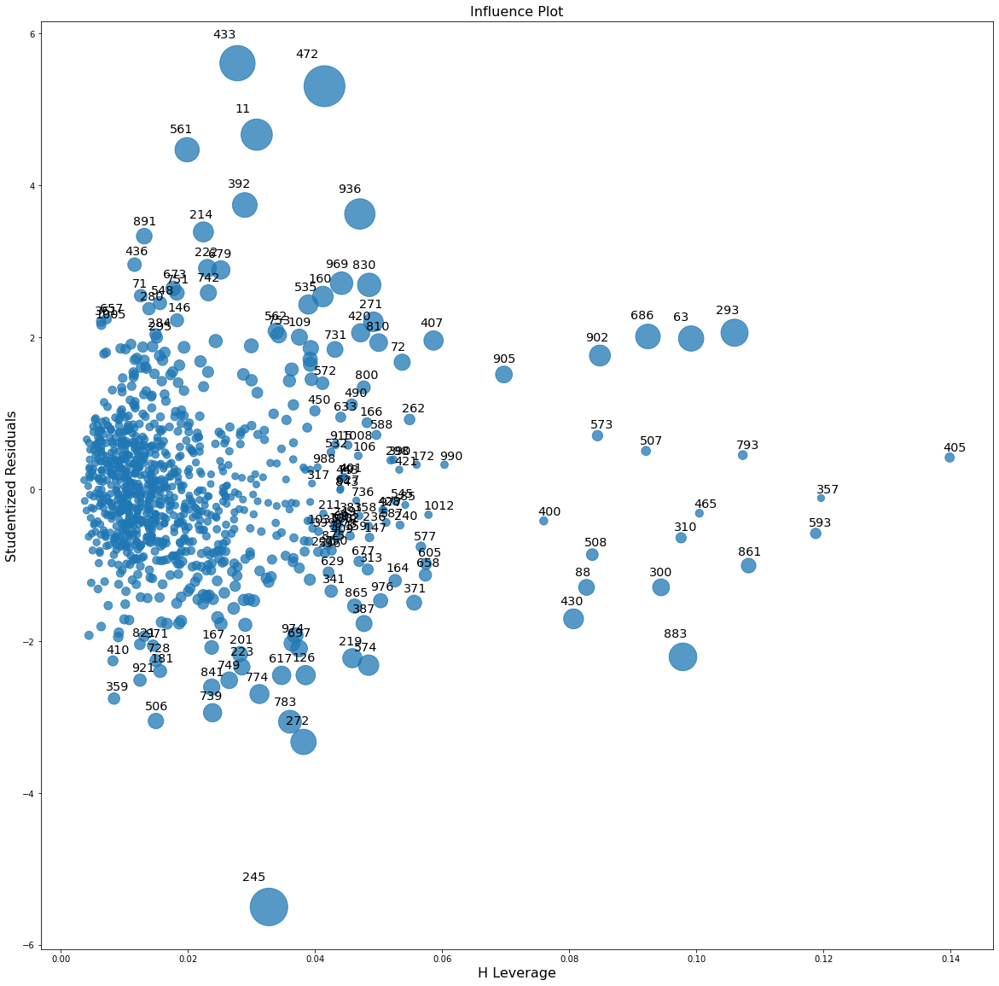

In [53]:
X_train_b_poly_4 = np.delete(X_train_b_poly_3, [13], axis = 1)

X_train_b_poly_4_const = sm.add_constant(X_train_b_poly_4)
model_b_poly_4_est = sm.OLS(y_train_b_poly_3, X_train_b_poly_4_const)
model_b_poly_4 = model_b_poly_4_est.fit()
print(model_b_poly_4.summary())

model_analysis(model_b_poly_4, X_train_b_poly_4)

In the plots below, for each variable we focus on the top right graph. For the linear response-predictor relationship we expect to see a random scatter plot and not be able to detect a trend. For non-correlated error terms, we expect to see that the points before and after are not-correlated. If they are correlated, it should be a smooth chart as the points are correlated. For homoskedastic error terms, we expect there to be a constant variance. If we see a cone shape of the residuals as they spread out, this is an indicator that the error terms are not homoskedastic.

For this model, I find that all the assumptions are met. 

eval_env: 1
eval_env: 1
eval_env: 1
eval_env: 1
eval_env: 1
eval_env: 1
eval_env: 1
eval_env: 1
eval_env: 1
eval_env: 1
eval_env: 1
eval_env: 1
eval_env: 1
eval_env: 1
eval_env: 1
eval_env: 1
eval_env: 1
eval_env: 1
eval_env: 1


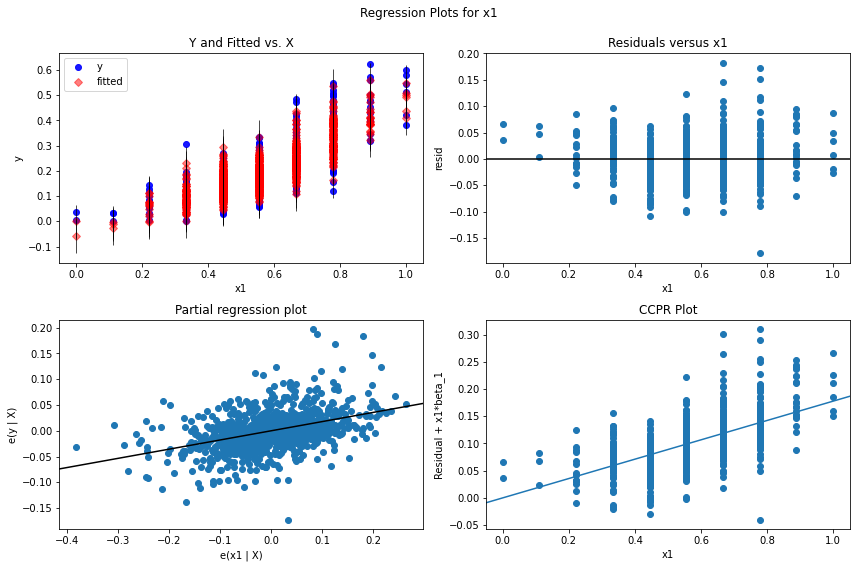

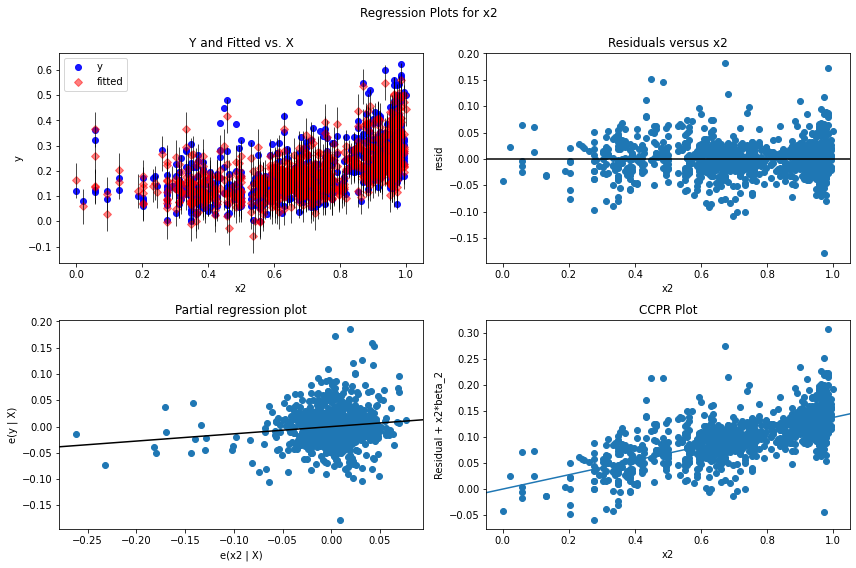

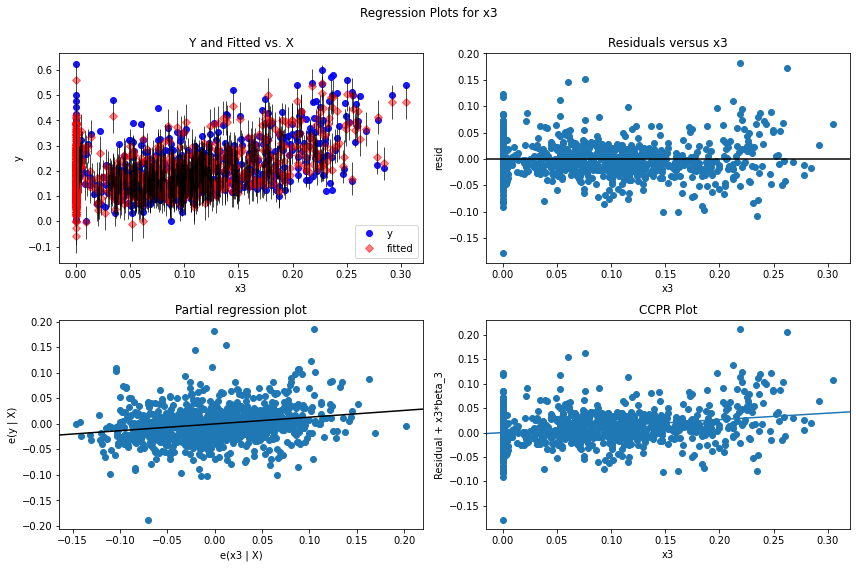

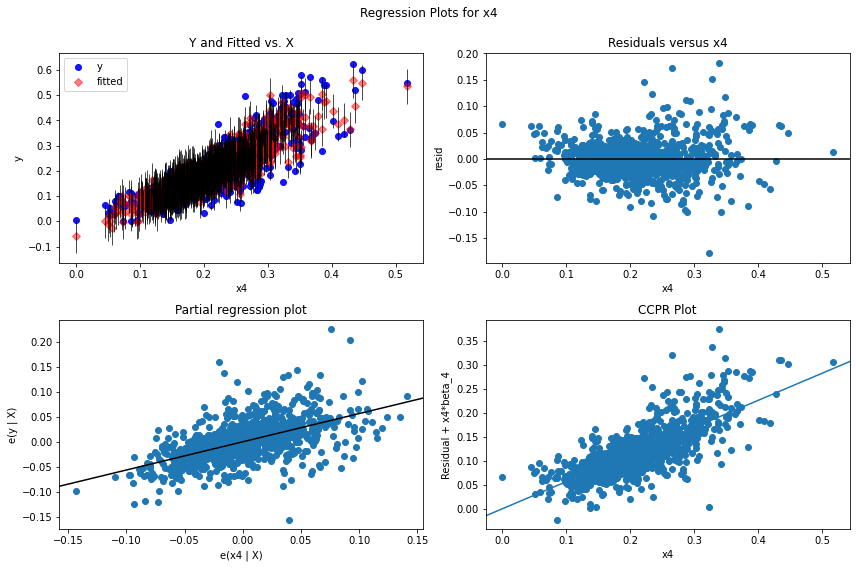

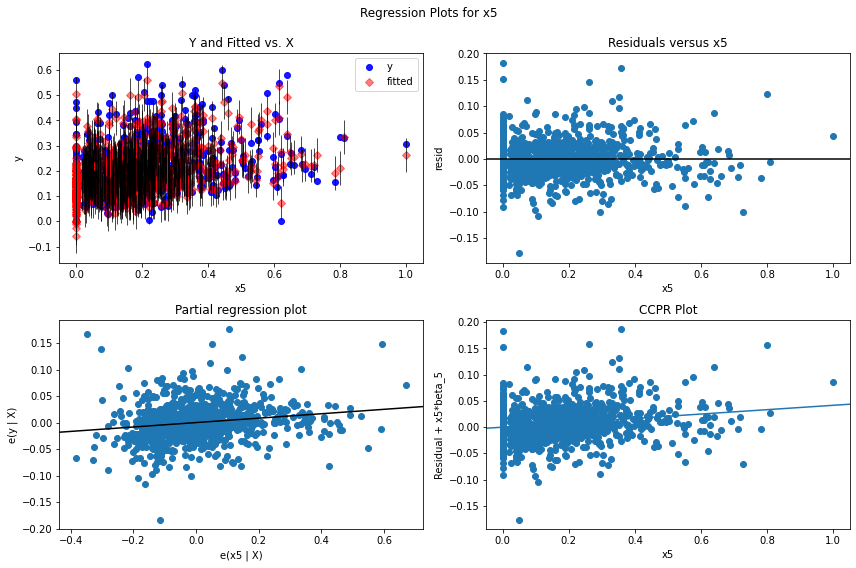

...

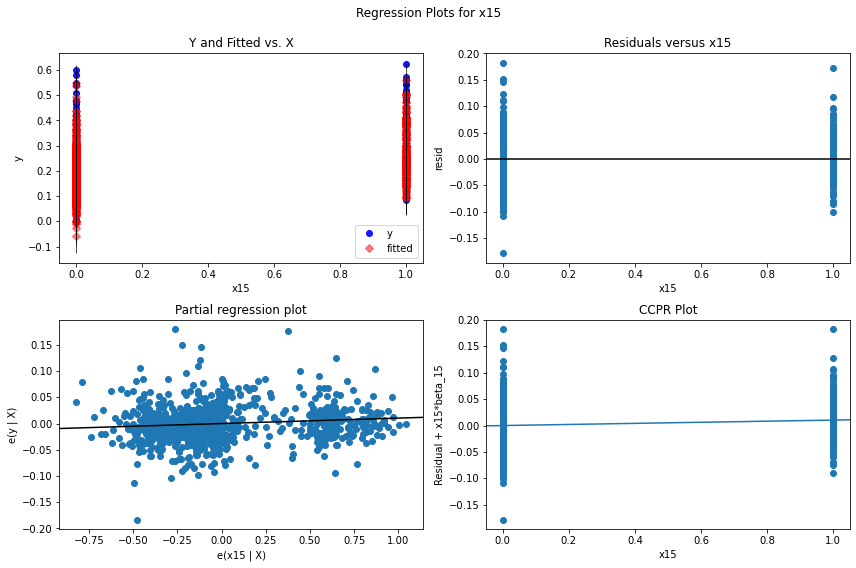

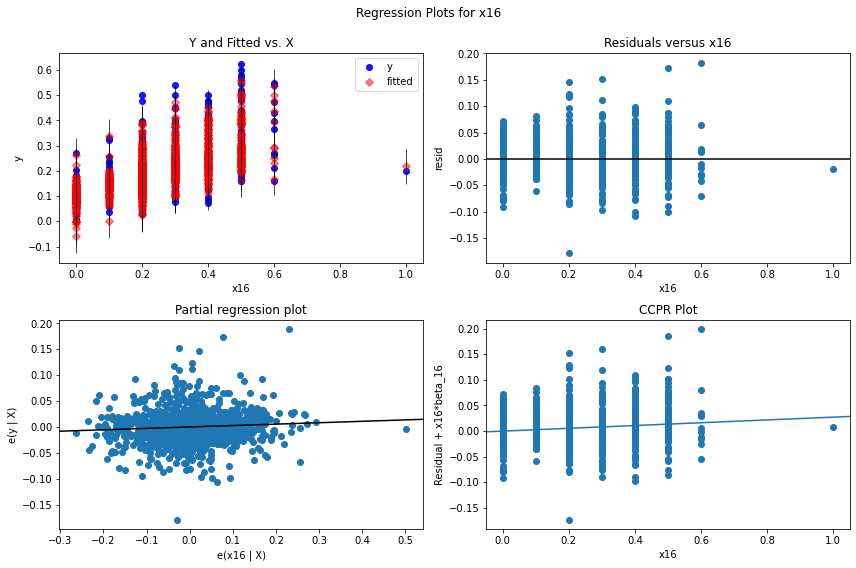

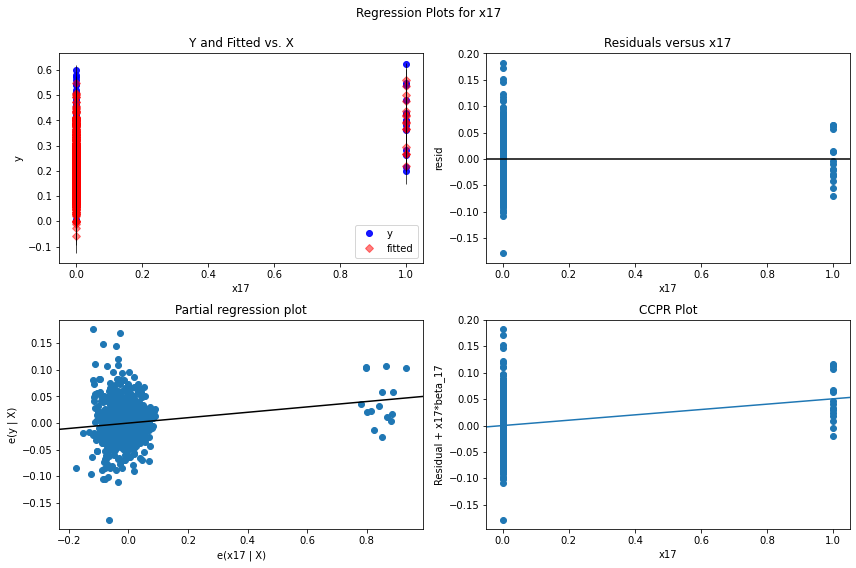

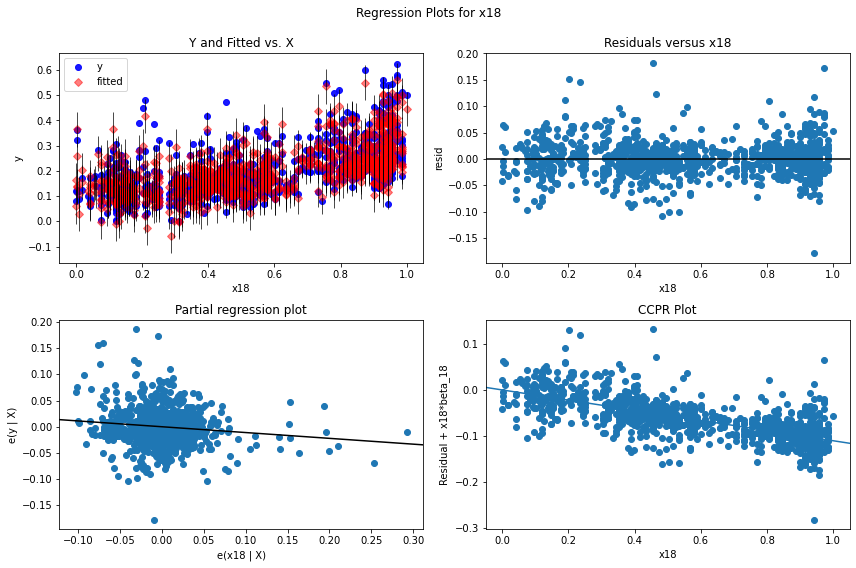

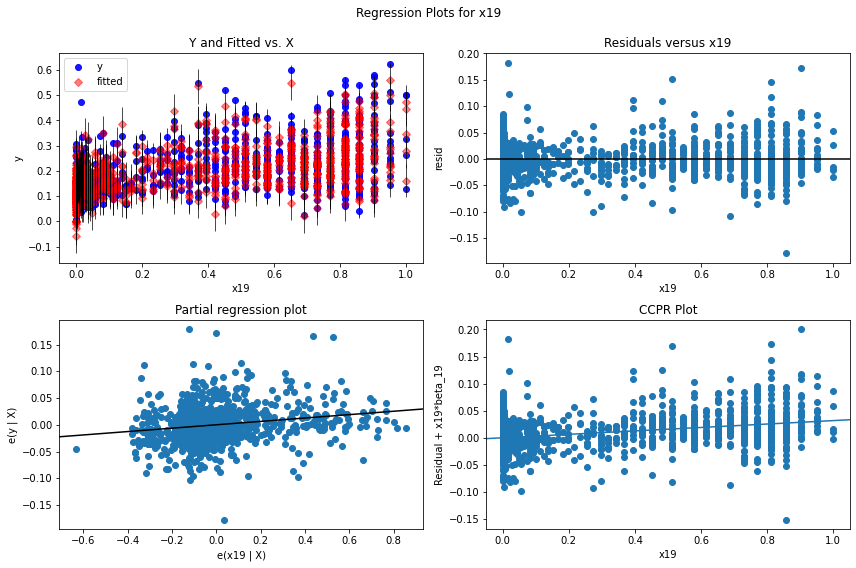

In [54]:
assumptions(model_b_poly_4, len(X_train_b_poly_4[0]))

#### Indicator function

For the indicator function, I use quartiles to determine the break points of the two variables that show a non-linear relationship with SalePrice. Looking at the graphs, to my eye there weren't clear numerical values where the trend of the scatter plots shifted drastically.

In [55]:
q25_1 = np.quantile(X_train_b[:, 1], 0.25, interpolation='midpoint')
q50_1 = np.quantile(X_train_b[:, 1], 0.5, interpolation='midpoint')
q75_1 = np.quantile(X_train_b[:, 1], 0.75, interpolation='midpoint')

q25_2 = np.quantile(X_train_b[:, 2], 0.25, interpolation='midpoint')
q50_2 = np.quantile(X_train_b[:, 2], 0.5, interpolation='midpoint')
q75_2 = np.quantile(X_train_b[:, 2], 0.75, interpolation='midpoint')

var1 = np.where(X_train_b[:, 1] < q25_1, 1, 0)
var2 = np.where(((X_train_b[:, 1] > q25_1) & (X_train_b[:, 1] < q50_1)), 1, 0)
var3 = np.where(((X_train_b[:, 1] > q50_1) & (X_train_b[:, 1] < q75_1)), 1, 0)
var4 = np.where(X_train_b[:, 1] > q75_1, 1, 0)

var5 = np.where(X_train_b[:, 2] < q25_2, 1, 0)
var6 = np.where(((X_train_b[:, 2] > q25_2) & (X_train_b[:, 1] < q50_2)), 1, 0)
var7 = np.where(((X_train_b[:, 2] > q50_2) & (X_train_b[:, 1] < q75_2)), 1, 0)
var8 = np.where(X_train_b[:, 2] > q75_2, 1, 0)

X_train_b_ind = np.column_stack([X_train_b, var1, var2, var3, var4, var5, var6, var7, var8])

I run the the model and find both a high R^2 value and f-statistic. Even though the new indicator variables are insignificant, I keep in the model the entire time. However, I do drop variables that are insignificant and are not part of the new indicator variable grouping.

In [56]:
X_train_b_ind_1_const = sm.add_constant(X_train_b_ind)
model_b_ind_1_est = sm.OLS(y_train_b, X_train_b_ind_1_const)
model_b_ind_1 = model_b_ind_1_est.fit()
print(model_b_ind_1.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.864
Model:                            OLS   Adj. R-squared:                  0.859
Method:                 Least Squares   F-statistic:                     145.1
Date:                Sun, 16 Jan 2022   Prob (F-statistic):               0.00
Time:                        07:55:04   Log-Likelihood:                 1841.4
No. Observations:                1022   AIC:                            -3595.
Df Residuals:                     978   BIC:                            -3378.
Df Model:                          43                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0798      0.033     -2.425      0.0

By dropping the insignificant variables, we do see our adjusted r^2 go down but that is okay since we want a generalized model. 

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.856
Model:                            OLS   Adj. R-squared:                  0.853
Method:                 Least Squares   F-statistic:                     247.7
Date:                Sun, 16 Jan 2022   Prob (F-statistic):               0.00
Time:                        07:55:05   Log-Likelihood:                 1811.7
No. Observations:                1022   AIC:                            -3573.
Df Residuals:                     997   BIC:                            -3450.
Df Model:                          24                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0540      0.010     -5.308      0.0

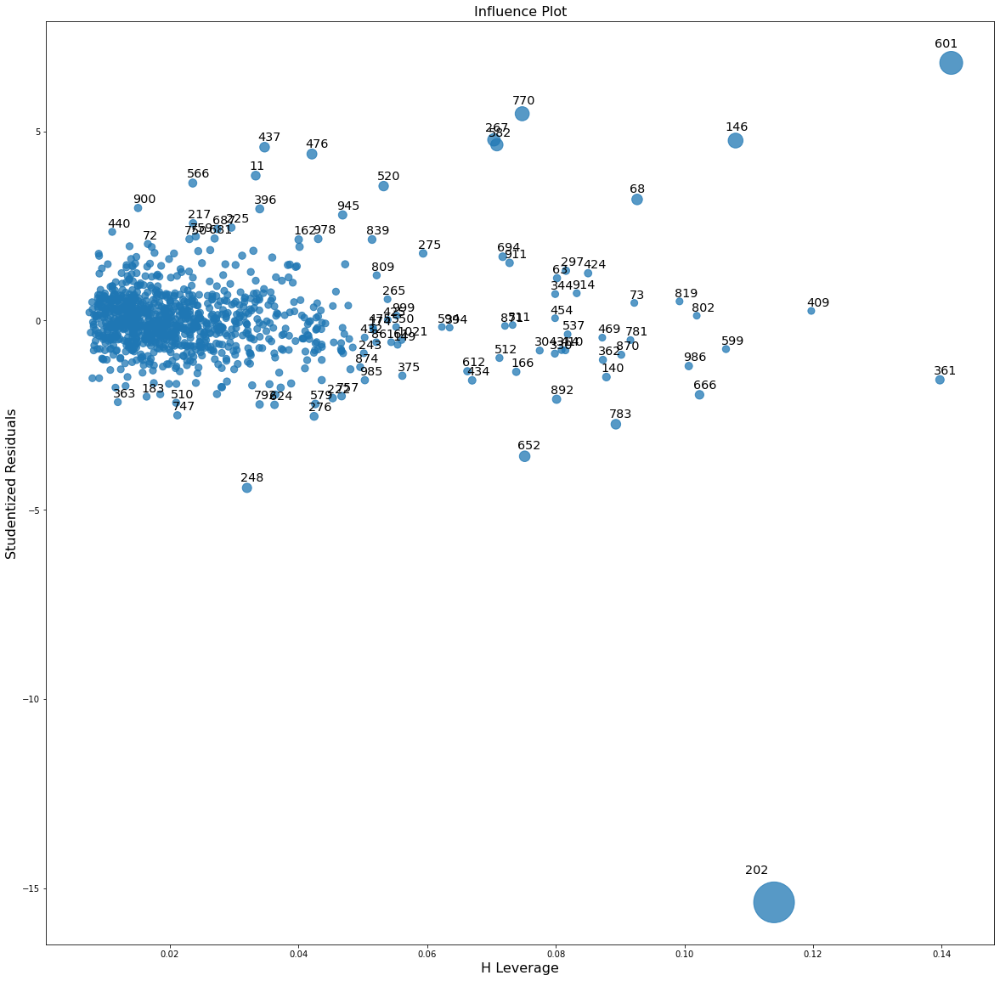

In [57]:
X_train_b_ind_2 = np.delete(X_train_b_ind, [1, 2, 6, 7, 10, 11, 15, 16, 20, 21, 22, 23, 25, 26, 28, 29, 30, 32, 34, 36], axis = 1)

X_train_b_ind_2_const = sm.add_constant(X_train_b_ind_2)
model_b_ind_2_est = sm.OLS(y_train_b, X_train_b_ind_2_const)
model_b_ind_2 = model_b_ind_2_est.fit()
print(model_b_ind_2.summary())

model_analysis(model_b_ind_2, X_train_b_ind_2)

We see that we have several observations that both have high leverage and are outliers. After we drop these observations, I rerun the model. We can see that the R^2 goes up and so does the F-stat indicating by dropping these observations, we've obtained a better fit for our model.

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.886
Model:                            OLS   Adj. R-squared:                  0.883
Method:                 Least Squares   F-statistic:                     319.2
Date:                Sun, 16 Jan 2022   Prob (F-statistic):               0.00
Time:                        07:55:09   Log-Likelihood:                 2005.1
No. Observations:                1013   AIC:                            -3960.
Df Residuals:                     988   BIC:                            -3837.
Df Model:                          24                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0571      0.008     -6.864      0.0

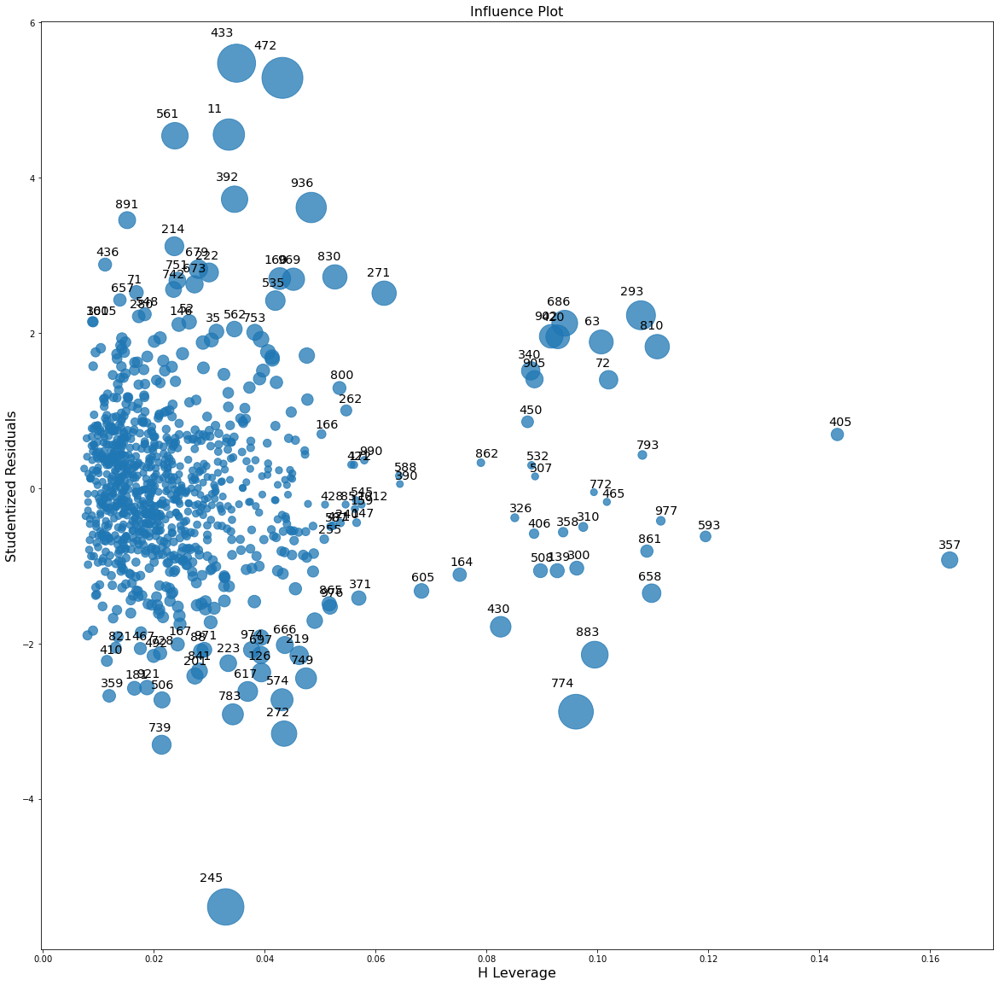

In [58]:
X_train_b_ind_3 = np.delete(X_train_b_ind_2, [68, 146, 202, 267, 520, 582, 601, 652, 770], axis = 0)
y_train_b_ind_3 = np.delete(y_train_b, [68, 146, 202, 267, 520, 582, 601, 652, 770], axis = 0)

X_train_b_ind_3_const = sm.add_constant(X_train_b_ind_3)
model_b_ind_3_est = sm.OLS(y_train_b_ind_3, X_train_b_ind_3_const)
model_b_ind_3 = model_b_ind_3_est.fit()
print(model_b_ind_3.summary())

model_analysis(model_b_ind_3, X_train_b_ind_3)

In the plots below, for each variable we focus on the top right graph. For the linear response-predictor relationship we expect to see a random scatter plot and not be able to detect a trend. For non-correlated error terms, we expect to see that the points before and after are not-correlated. If they are correlated, it should be a smooth chart as the points are correlated. For homoskedastic error terms, we expect there to be a constant variance. If we see a cone shape of the residuals as they spread out, this is an indicator that the error terms are not homoskedastic.

For this model, I find that all the assumptions are met. 

eval_env: 1
eval_env: 1
eval_env: 1
eval_env: 1
eval_env: 1
eval_env: 1
eval_env: 1
eval_env: 1
eval_env: 1
eval_env: 1
eval_env: 1
eval_env: 1
eval_env: 1
eval_env: 1
eval_env: 1
eval_env: 1
eval_env: 1
eval_env: 1
eval_env: 1
eval_env: 1


/tmp/ipykernel_2211/3732577483.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=(12,8))


eval_env: 1
eval_env: 1
eval_env: 1
eval_env: 1


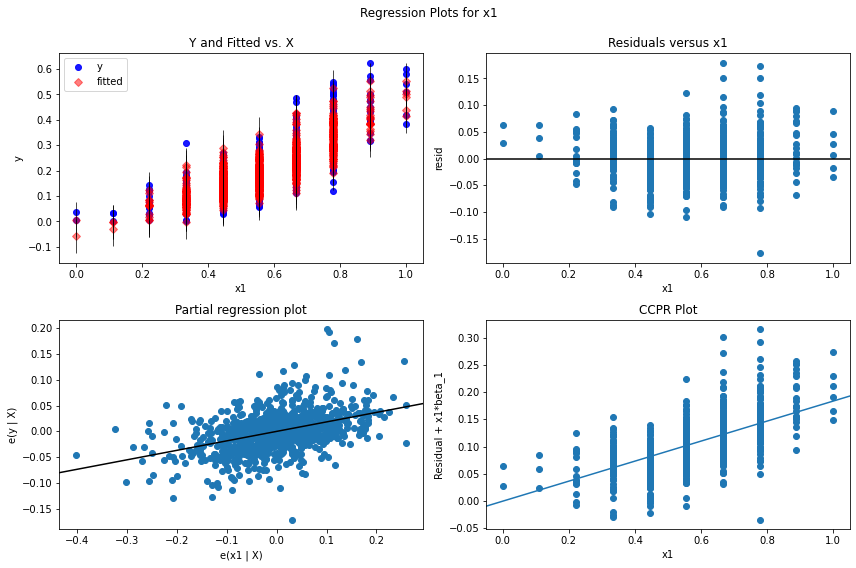

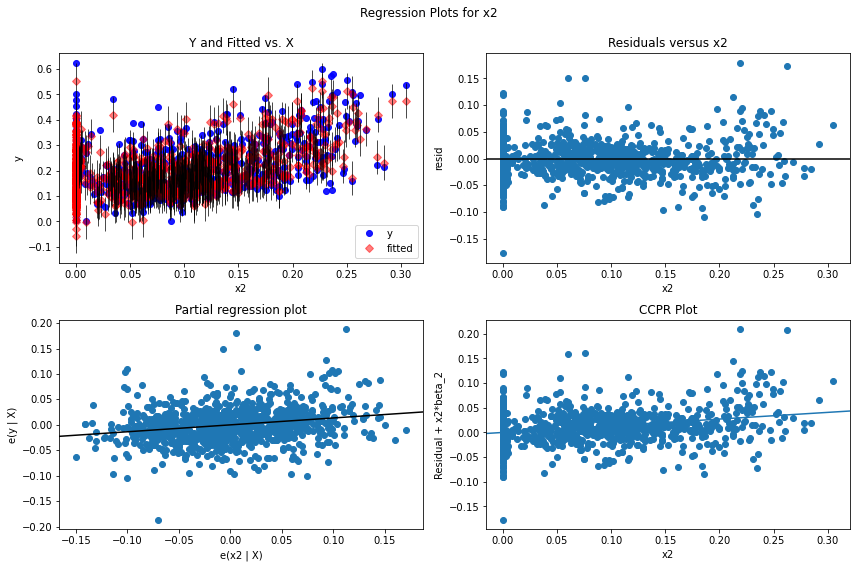

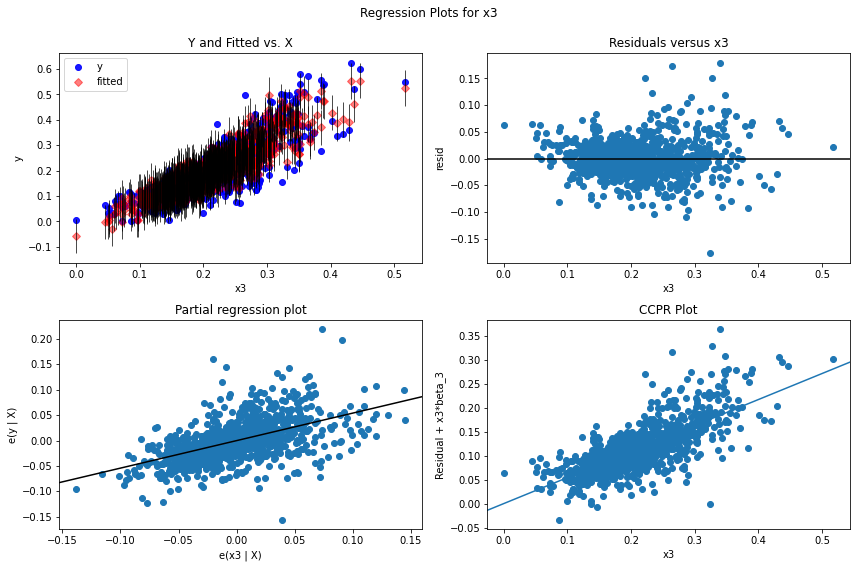

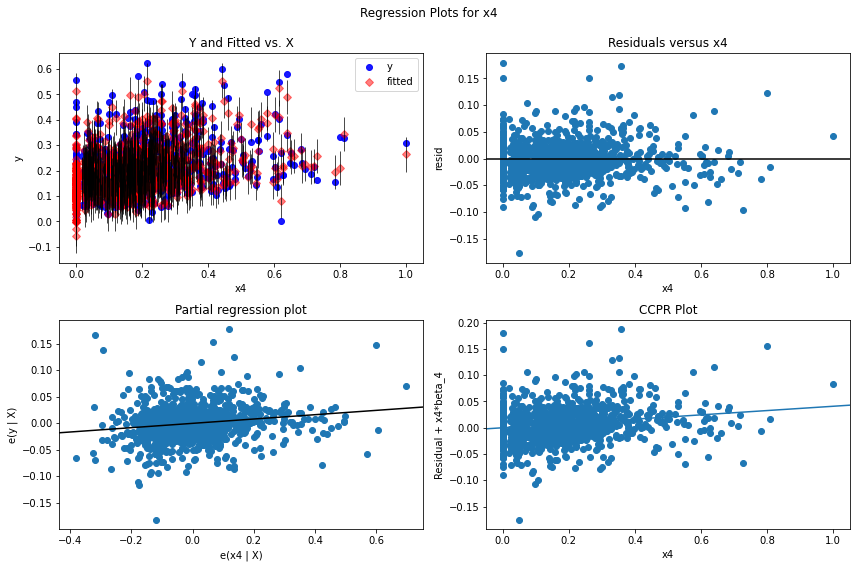

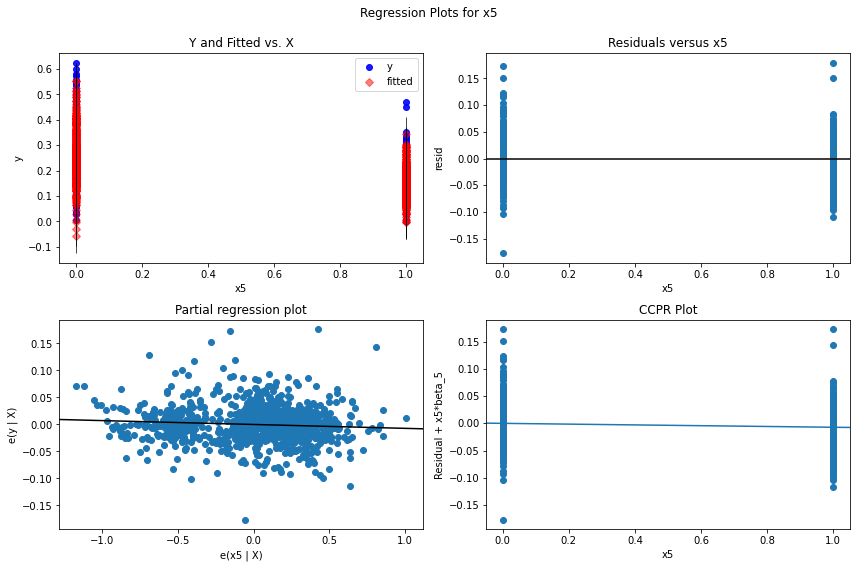

...

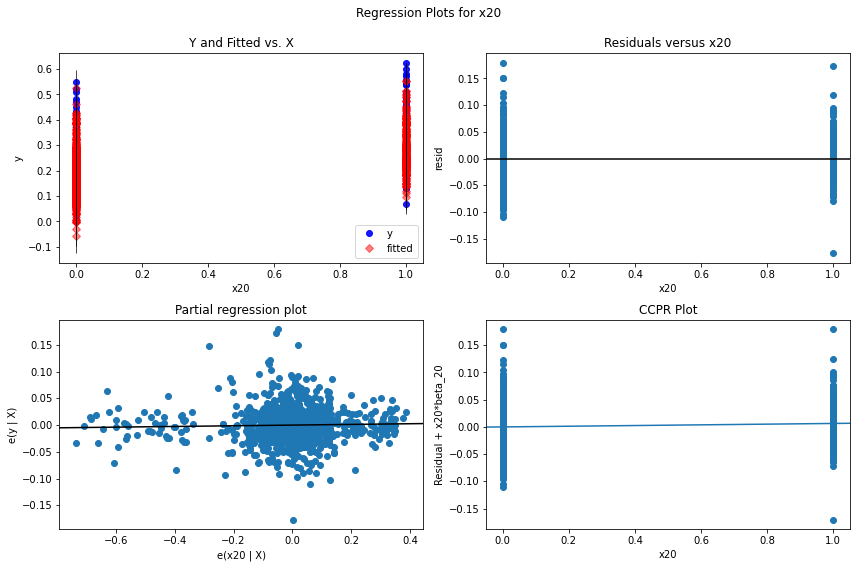

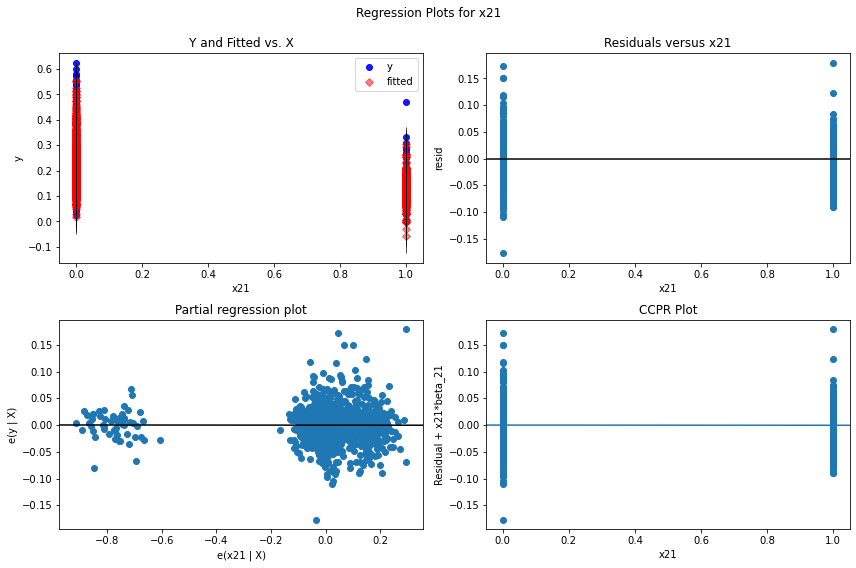

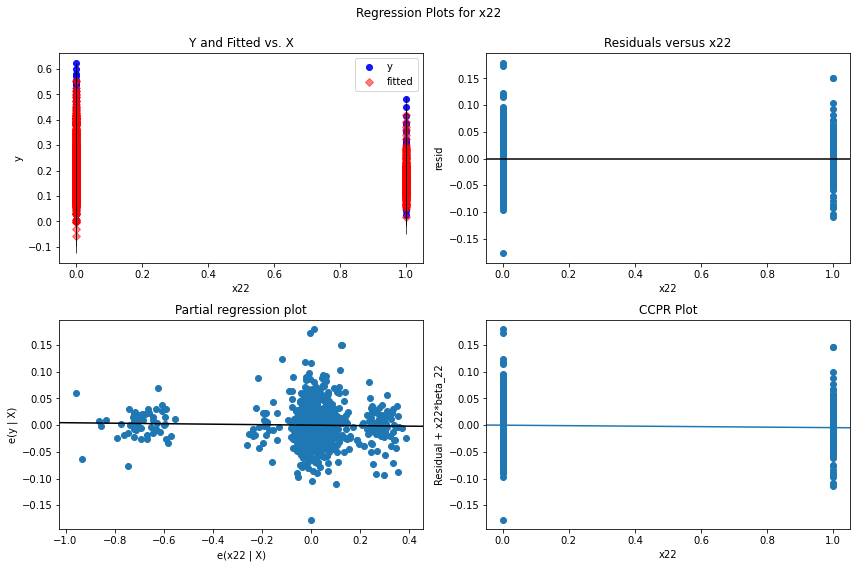

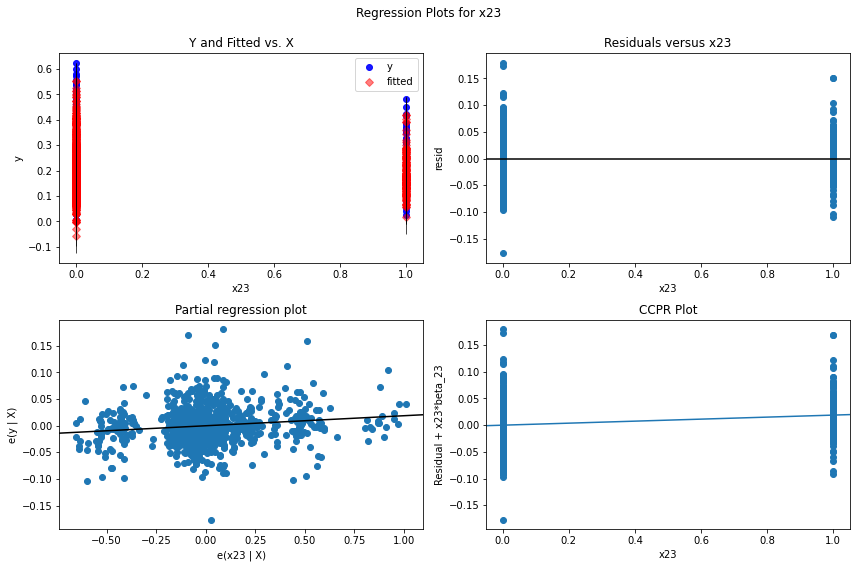

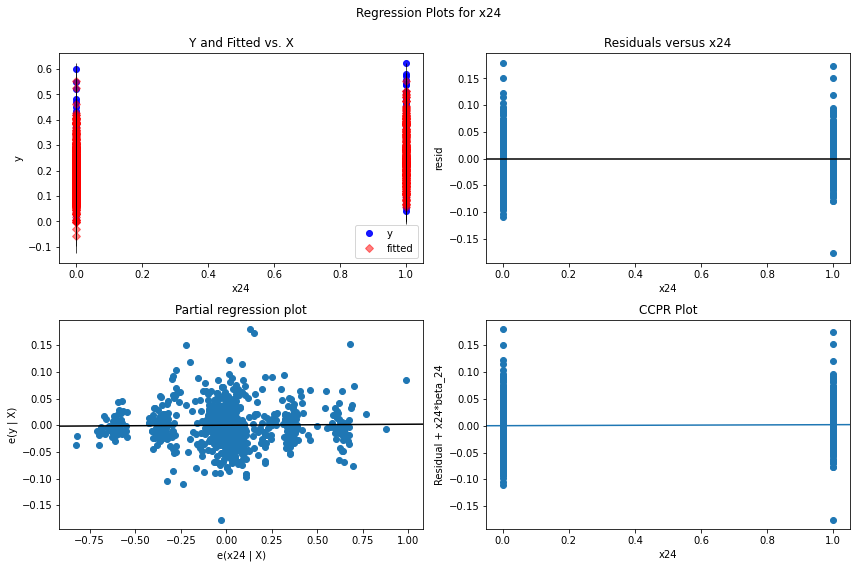

In [59]:
assumptions(model_b_ind_3, len(X_train_b_ind_3[0]))

#### Piecewise polynomials

For piecewise polynomials, I use quartiles to determine the knots. This follows the same logic as for the indicator function since I don't see clear cut points in the overall trend line. The end prediction results will be interesting since we can directly compare this model and the indicator function model since one is using dummy variables for specific bins while the other one is using polynomials for the same buckets.

In [60]:
for i in q25_1, q50_1, q75_1, q25_2, q50_2, q75_2:
    print(i)

0.5942028985507246
0.72463768115942
0.9275362318840585
0.28333333333333144
0.7166666666666686
0.8833333333333329


In [61]:
transformed_x1 = dmatrix("bs(train, knots=(0.5942028985507246,0.72463768115942,0.9275362318840585), degree=3, include_intercept=False)", {"train": X_train_b[:, 1]}, return_type='matrix')
transformed_x2 = dmatrix("bs(train, knots=(0.28333333333333144,0.7166666666666686,0.8833333333333329), degree =3, include_intercept=False)", {"train": X_train_b[:, 2]}, return_type='matrix')

In [62]:
X_train_b_pwp = np.column_stack([X_train_b, transformed_x1, transformed_x2])

We see a high adj. R^2 and F-stat from the first iteration which is a good sign. I drop any insignificant variables that aren't part of the piecewise polynomial group of variables.

In [63]:
X_train_b_pwp_1_const = sm.add_constant(X_train_b_pwp)
model_b_pwp_1_est = sm.OLS(y_train_b, X_train_b_pwp_1_const)
model_b_pwp_1 = model_b_pwp_1_est.fit()
print(model_b_pwp_1.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.866
Model:                            OLS   Adj. R-squared:                  0.860
Method:                 Least Squares   F-statistic:                     140.1
Date:                Sun, 16 Jan 2022   Prob (F-statistic):               0.00
Time:                        07:55:39   Log-Likelihood:                 1847.0
No. Observations:                1022   AIC:                            -3602.
Df Residuals:                     976   BIC:                            -3375.
Df Model:                          45                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
x1             0.1668      0.016     10.532      0.0

We see our R^2 go down indicating that collectively these 10+ variables appeared to have some explanatory power. However, our F-stat goes up.

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.860
Model:                            OLS   Adj. R-squared:                  0.856
Method:                 Least Squares   F-statistic:                     203.2
Date:                Sun, 16 Jan 2022   Prob (F-statistic):               0.00
Time:                        07:55:40   Log-Likelihood:                 1825.3
No. Observations:                1022   AIC:                            -3589.
Df Residuals:                     991   BIC:                            -3436.
Df Model:                          30                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
x1             0.1851      0.015     12.171      0.0

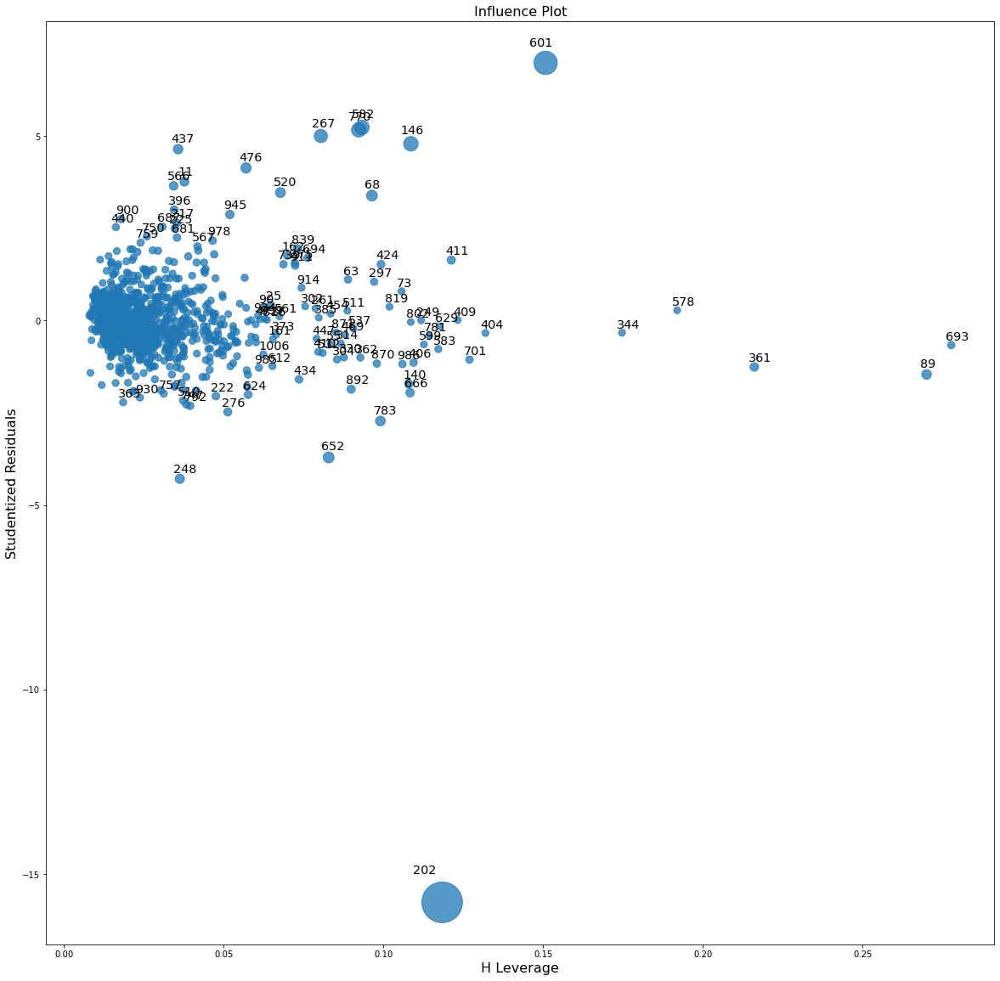

In [64]:
X_train_b_pwp_2 = np.delete(X_train_b_pwp, [2, 6, 7, 10, 11, 16, 20, 21, 22, 23, 25, 26, 28, 29, 30, 32, 34, 36, 37], axis = 1)

X_train_b_pwp_2_const = sm.add_constant(X_train_b_pwp_2)
model_b_pwp_2_est = sm.OLS(y_train_b, X_train_b_pwp_2_const)
model_b_pwp_2 = model_b_pwp_2_est.fit()
print(model_b_pwp_2.summary())

model_analysis(model_b_pwp_2, X_train_b_pwp_2)

I drop observations with high leverage and who are also outliers. We see our R^2 go up indicating we have a better fitted regression line. We check the VIF scores and find that some of the piecewise polynomial variables exhibit high collinearity between themselves and their original untransformed variable. This makes sense and I don't drop these variables.

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.891
Model:                            OLS   Adj. R-squared:                  0.888
Method:                 Least Squares   F-statistic:                     268.8
Date:                Sun, 16 Jan 2022   Prob (F-statistic):               0.00
Time:                        07:55:47   Log-Likelihood:                 2031.0
No. Observations:                1013   AIC:                            -4000.
Df Residuals:                     982   BIC:                            -3847.
Df Model:                          30                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
x1             0.1708      0.012     13.891      0.0

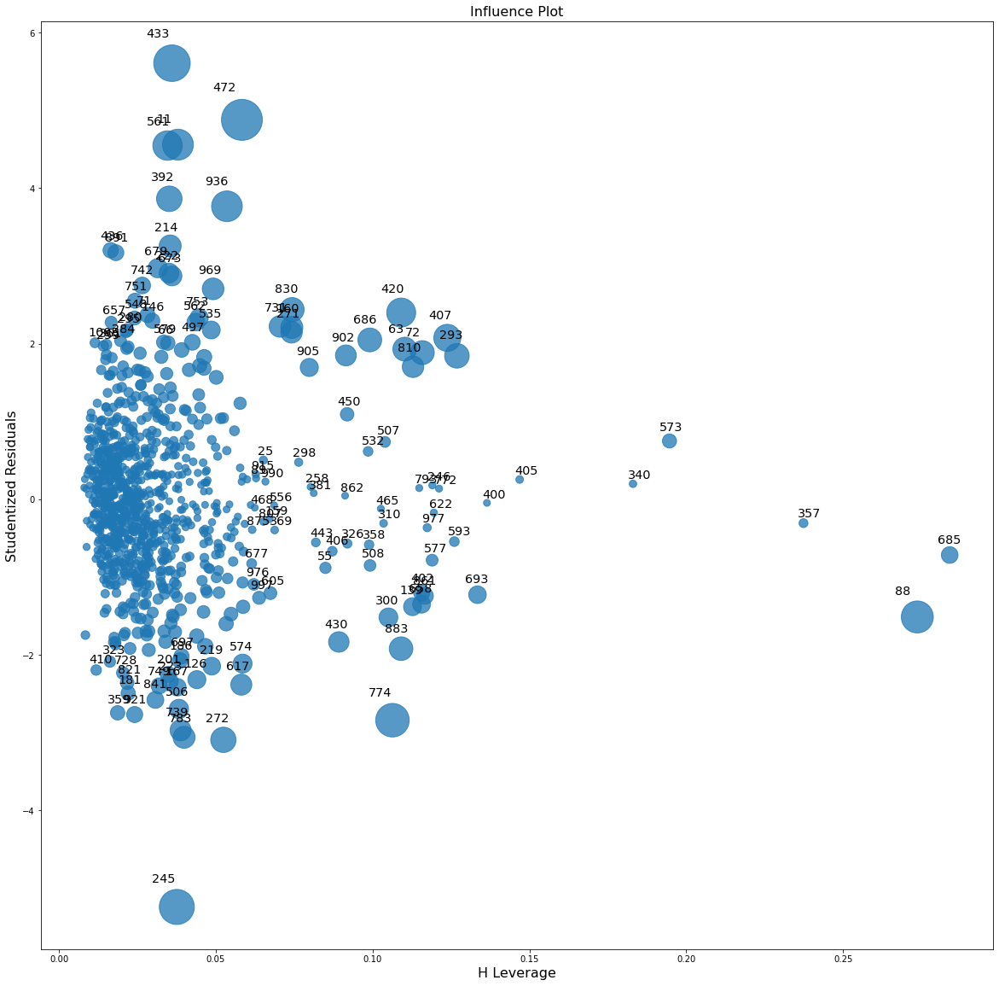

In [65]:
X_train_b_pwp_3 = np.delete(X_train_b_pwp_2, [68, 146, 202, 267, 520, 582, 601, 652, 770], axis = 0)
y_train_b_pwp_3 = np.delete(y_train_b, [68, 146, 202, 267, 520, 582, 601, 652, 770], axis = 0)

X_train_b_pwp_3_const = sm.add_constant(X_train_b_pwp_3)
model_b_pwp_3_est = sm.OLS(y_train_b_pwp_3, X_train_b_pwp_3_const)
model_b_pwp_3 = model_b_pwp_3_est.fit()
print(model_b_pwp_3.summary())

model_analysis(model_b_pwp_3, X_train_b_pwp_3)

In the plots below, for each variable we focus on the top right graph. For the linear response-predictor relationship we expect to see a random scatter plot and not be able to detect a trend. For non-correlated error terms, we expect to see that the points before and after are not-correlated. If they are correlated, it should be a smooth chart as the points are correlated. For homoskedastic error terms, we expect there to be a constant variance. If we see a cone shape of the residuals as they spread out, this is an indicator that the error terms are not homoskedastic.

For this model, I find that all the assumptions are met. 

eval_env: 1
eval_env: 1
eval_env: 1
eval_env: 1
eval_env: 1
eval_env: 1
eval_env: 1
eval_env: 1
eval_env: 1
eval_env: 1
eval_env: 1
eval_env: 1
eval_env: 1
eval_env: 1
eval_env: 1
eval_env: 1
eval_env: 1
eval_env: 1
eval_env: 1
eval_env: 1


/tmp/ipykernel_2211/3732577483.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=(12,8))


eval_env: 1
eval_env: 1
eval_env: 1
eval_env: 1
eval_env: 1
eval_env: 1
eval_env: 1
eval_env: 1
eval_env: 1
eval_env: 1


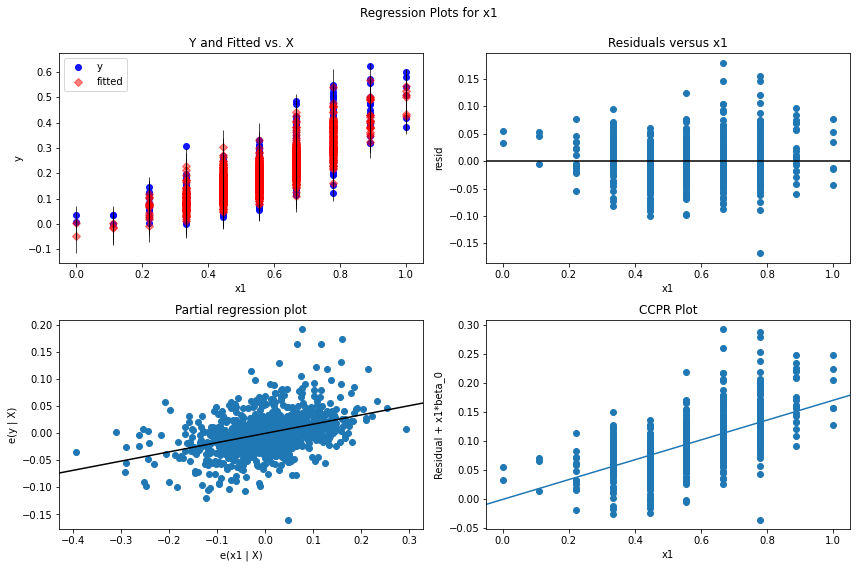

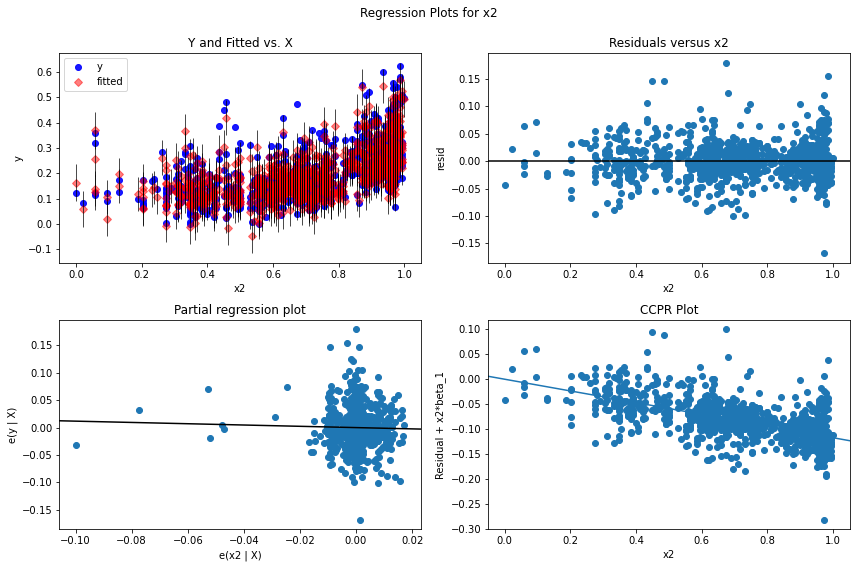

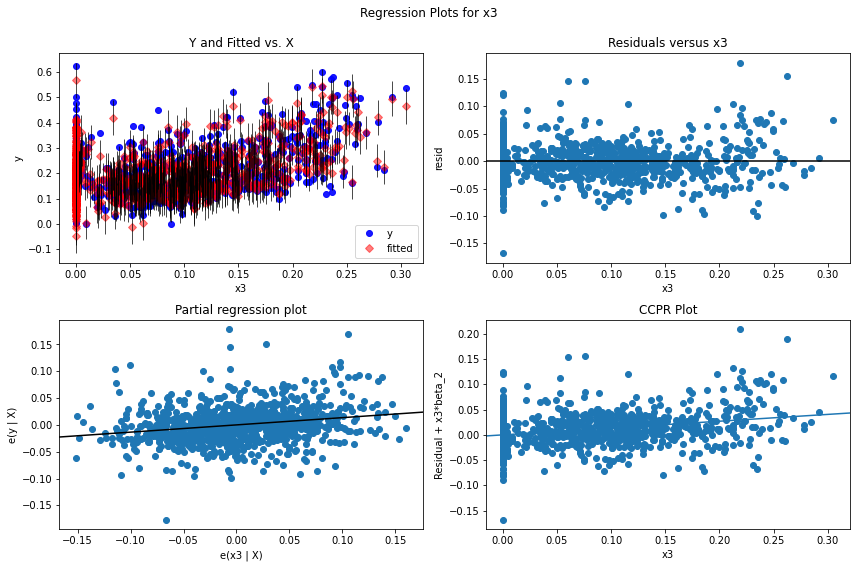

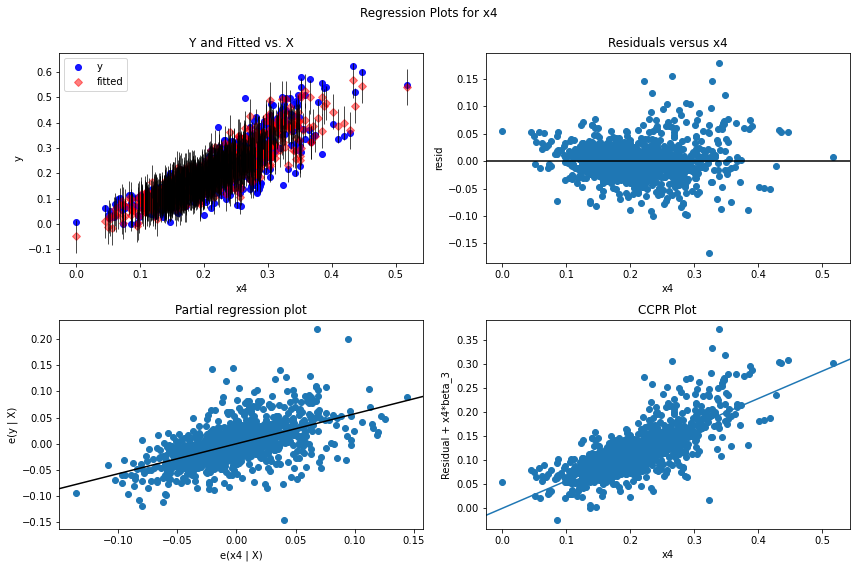

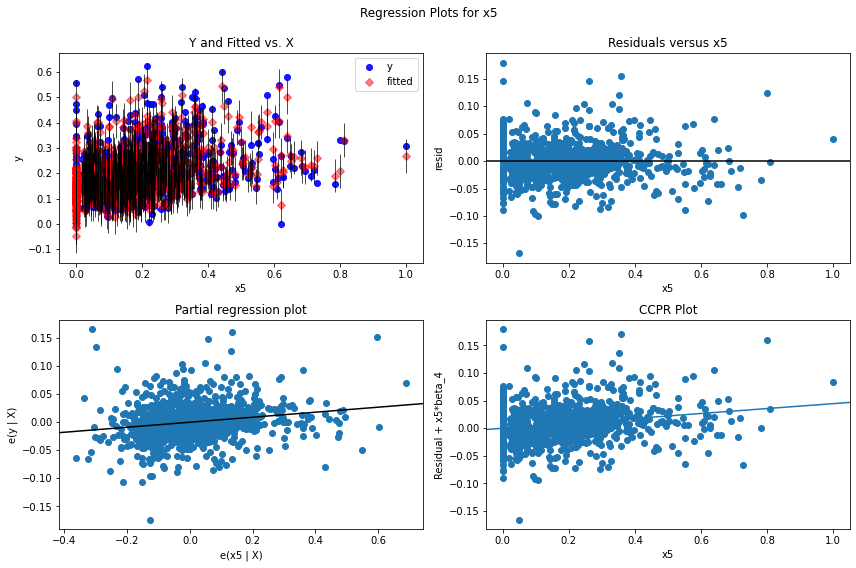

...

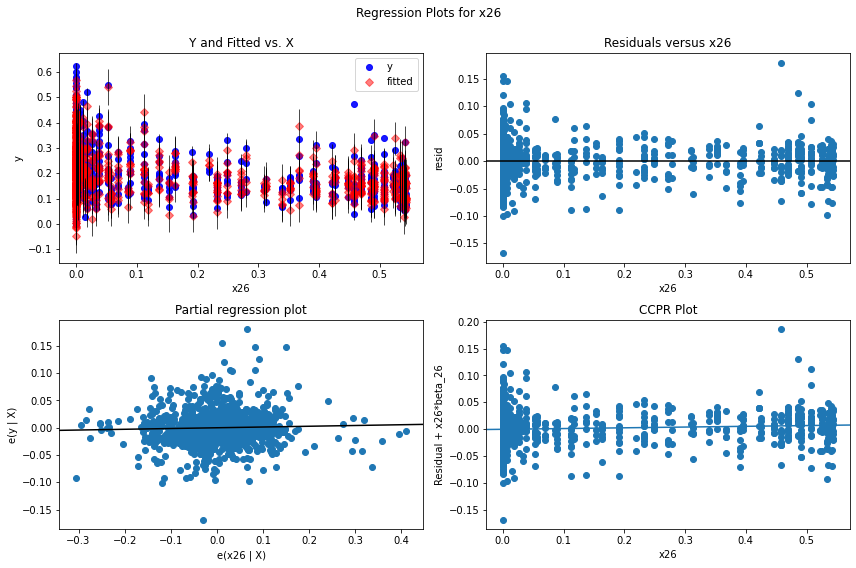

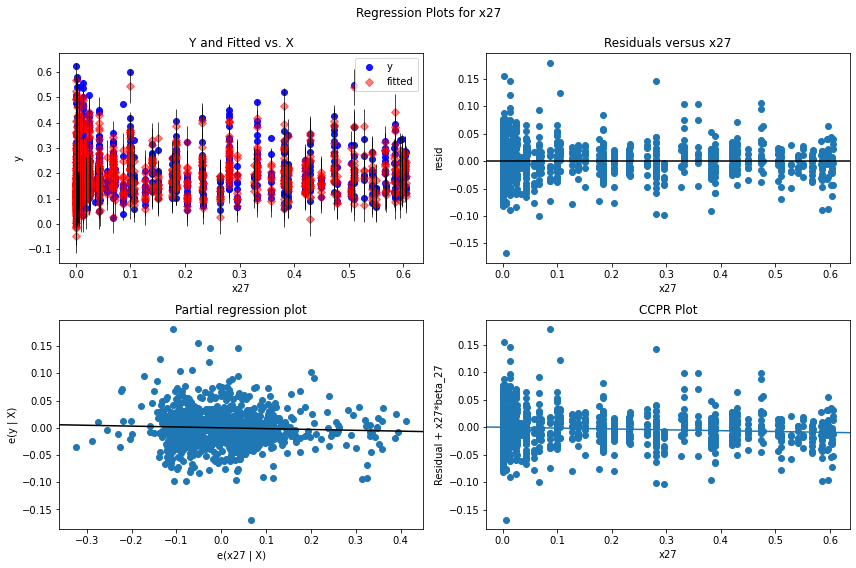

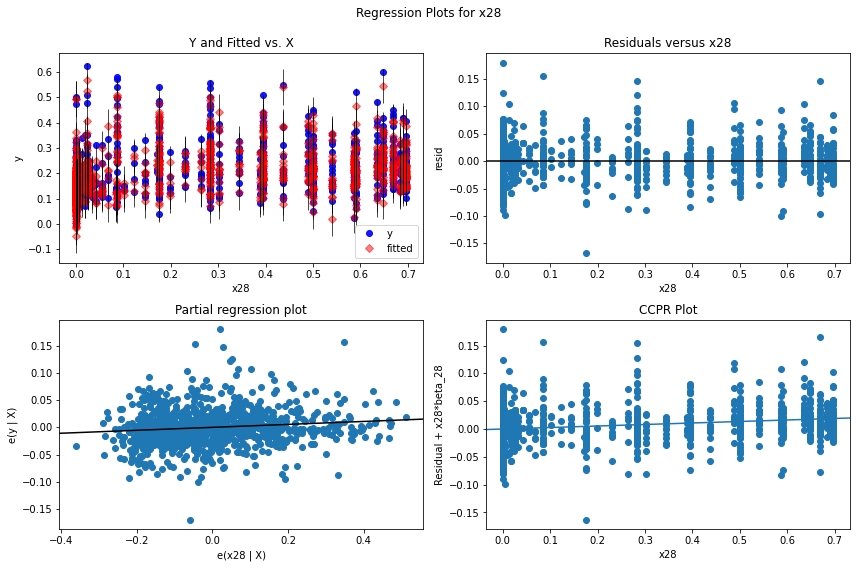

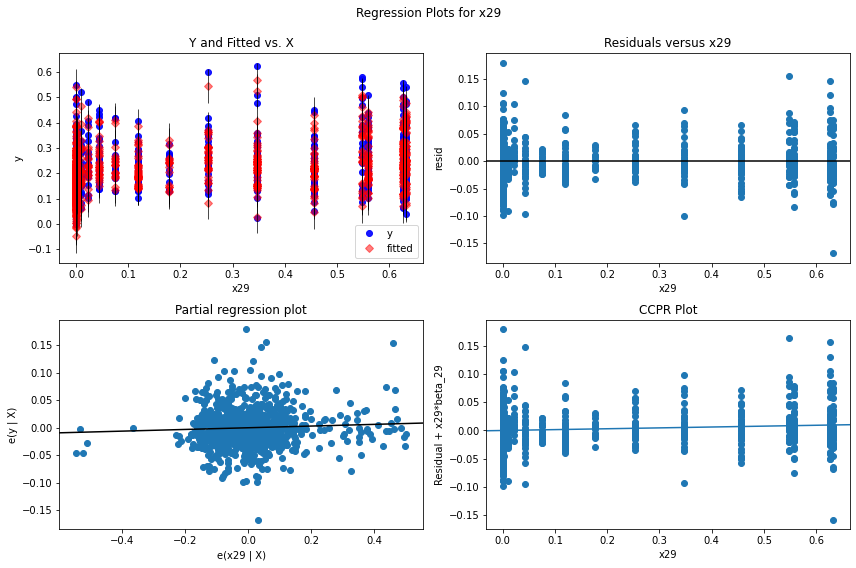

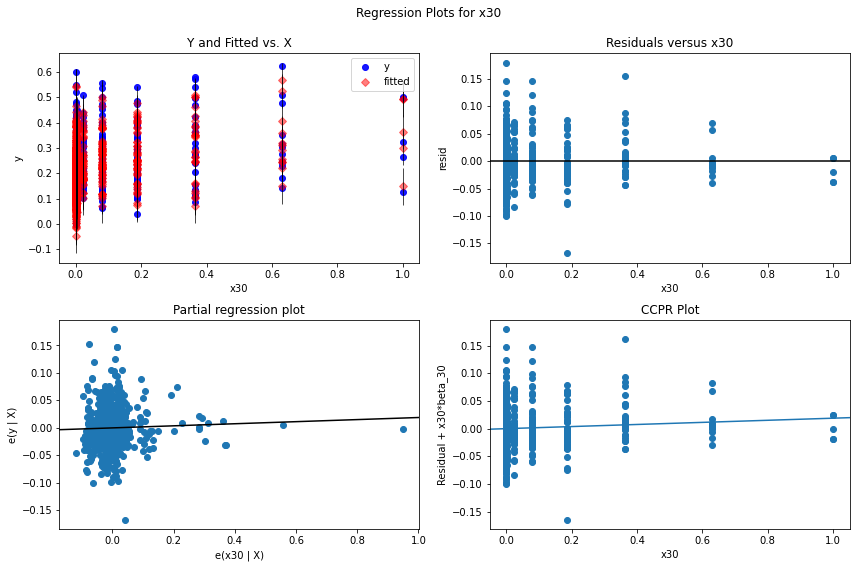

<Figure size 864x576 with 0 Axes>

In [66]:
assumptions(model_b_pwp_3, len(X_train_b_pwp_3[0]))

#### Cross-wise validation of non-linear models

Since I am satisfied with where each variation of model B is, I now switch to sklearn to conduct cross-validation. I prefer statsmodel's OLS regression when developing since I can easily get coefficients and p scores. However, sklearn provides cross-validation procedures and is easier to handle predictions.

All three of these models generate a mean R^2 of around .88 with a standard deviation of .02. We have a better R^2 and a lower standard deviation indicating that these models provide better predictive power than the linear regression with no non-linear components.

In [67]:
linear_reg = LinearRegression()
model_b_poly_scores = cross_val_score(linear_reg, X_train_b_poly_4, y_train_b_poly_3, cv=10)

print("Scores:", model_b_poly_scores)
print("Mean:", model_b_poly_scores.mean())
print("Standard deviation:", model_b_poly_scores.std())

Scores: [0.87058302 0.89606464 0.8302207  0.92088928 0.86715216 0.87025181
 0.87679288 0.87263446 0.90545865 0.86204312]
Mean: 0.87720907242848
Standard deviation: 0.02390396235160102


In [68]:
linear_reg = LinearRegression()
model_b_ind_scores = cross_val_score(linear_reg, X_train_b_ind_3, y_train_b_ind_3, cv=10)

print("Scores:", model_b_ind_scores)
print("Mean:", model_b_ind_scores.mean())
print("Standard deviation:", model_b_ind_scores.std())

Scores: [0.8689416  0.88800232 0.83474871 0.9186926  0.86657693 0.85994001
 0.87105934 0.87256967 0.90302271 0.86372446]
Mean: 0.8747278341397507
Standard deviation: 0.0222841417037986


In [69]:
linear_reg = LinearRegression()
model_b_pwp_scores = cross_val_score(linear_reg, X_train_b_pwp_3, y_train_b_pwp_3, cv=10)

print("Scores:", model_b_pwp_scores)
print("Mean:", model_b_pwp_scores.mean())
print("Standard deviation:", model_b_pwp_scores.std())

Scores: [0.86668288 0.88736875 0.83821257 0.92399879 0.86851068 0.87511253
 0.87242948 0.87333436 0.90765619 0.8653712 ]
Mean: 0.8778677432036401
Standard deviation: 0.02259372459496683


## Conclusion

### Validation set

I now take each of these four models to the validation sets to test. The cross-validation with the training set help verify that I haven't over-fitted but using new data that the models haven't seen will show if they were over-fitted or not and give insight to how they will perform on the test set.

We see that RMSE of the linear model with no non-linear components is the highest. The linear model with non-linear components have similar RMSEs though the one with piecewise polynomials has slightly higher RMSE. It will be interesting to see on the test set which ones perform the best. Potentially the other two were over-fitted and the piecewise polynomial model will end up being able to provide the best predictions.

In [70]:
linear = LinearRegression()

linear.fit(X_train_a_4, y_train_a_4)

X_test_linear = np.delete(X_test_a, [1, 4, 10, 11, 13, 14, 15, 16, 19, 20, 21, 22, 23, 24, 26, 27, 28, 29, 31, 32, 34, 35], axis = 1)
X_test_linear = np.delete(X_test_linear, [12, 13], axis = 1)

linear_predictions = linear.predict(X_test_linear)
print('RMSE Of Linear Model: ')
print(sqrt(mean_squared_error(y_test_a, linear_predictions)))

RMSE Of Linear Model: 
0.06022481916268733


In [71]:
linear_poly = LinearRegression()
linear_poly.fit(X_train_b_poly_4, y_train_b_poly_3)

X_test_linear_poly = np.column_stack([X_test_b, X_test_b[:, 1] ** 2])
X_test_linear_poly = np.column_stack([X_test_linear_poly, X_test_b[:, 2] ** 3])

X_test_linear_poly = np.delete(X_test_linear_poly, [2, 6, 7, 10, 11, 15, 16, 20, 21, 22, 23, 25, 26, 28, 29, 30, 32, 34], axis = 1)
X_test_linear_poly = np.delete(X_test_linear_poly, [13], axis = 1)

linear_poly_predictions = linear_poly.predict(X_test_linear_poly)
print('RMSE Of Linear Model with Polynomials: ')
print(sqrt(mean_squared_error(y_test_b, linear_poly_predictions)))

RMSE Of Linear Model with Polynomials: 
0.055847819588241136


In [72]:
linear_ind = LinearRegression()

linear_ind.fit(X_train_b_ind_3, y_train_b_ind_3)

q25_1 = np.quantile(X_test_b[:, 1], 0.25, interpolation='midpoint')
q50_1 = np.quantile(X_test_b[:, 1], 0.5, interpolation='midpoint')
q75_1 = np.quantile(X_test_b[:, 1], 0.75, interpolation='midpoint')

q25_2 = np.quantile(X_test_b[:, 2], 0.25, interpolation='midpoint')
q50_2 = np.quantile(X_test_b[:, 2], 0.5, interpolation='midpoint')
q75_2 = np.quantile(X_test_b[:, 2], 0.75, interpolation='midpoint')

var1 = np.where(X_test_b[:, 1] < q25_1, 1, 0)
var2 = np.where(((X_test_b[:, 1] > q25_1) & (X_test_b[:, 1] < q50_1)), 1, 0)
var3 = np.where(((X_test_b[:, 1] > q50_1) & (X_test_b[:, 1] < q75_1)), 1, 0)
var4 = np.where(X_test_b[:, 1] > q75_1, 1, 0)

var5 = np.where(X_test_b[:, 2] < q25_2, 1, 0)
var6 = np.where(((X_test_b[:, 2] > q25_2) & (X_test_b[:, 1] < q50_2)), 1, 0)
var7 = np.where(((X_test_b[:, 2] > q50_2) & (X_test_b[:, 1] < q75_2)), 1, 0)
var8 = np.where(X_test_b[:, 2] > q75_2, 1, 0)

X_test_linear_ind = np.column_stack([X_test_b, var1, var2, var3, var4, var5, var6, var7, var8])
X_test_linear_ind = np.delete(X_test_linear_ind, [1, 2, 6, 7, 10, 11, 15, 16, 20, 21, 22, 23, 25, 26, 28, 29, 30, 32, 34, 36], axis = 1)

linear_ind_predictions = linear_ind.predict(X_test_linear_ind)
print('RMSE Of Linear Model with an Indicator Function: ')
print(sqrt(mean_squared_error(y_test_b, linear_ind_predictions)))

RMSE Of Linear Model with an Indicator Function: 
0.055840099699143164


In [73]:
linear_pwp = LinearRegression()

linear_pwp.fit(X_train_b_pwp_3, y_train_b_pwp_3)

transformed_x1 = dmatrix("bs(train, knots=(0.5942028985507246,0.7355072463768124,0.9420289855072461), degree=3, include_intercept=False)", {"train": X_test_b[:, 1]}, return_type='matrix')
transformed_x2 = dmatrix("bs(train, knots=(0.2666666666666657,0.75,0.8999999999999986), degree =3, include_intercept=False)", {"train": X_test_b[:, 2]}, return_type='matrix')
X_test_linear_pwp = np.column_stack([X_test_b, transformed_x1, transformed_x2])

X_test_linear_pwp = np.delete(X_test_linear_pwp, [2, 6, 7, 10, 11, 16, 20, 21, 22, 23, 25, 26, 28, 29, 30, 32, 34, 36, 37], axis = 1)

linear_pwp_predictions = linear_pwp.predict(X_test_linear_pwp)
print('RMSE Of Linear Model with an Piecewise Polynomial Function: ')
print(sqrt(mean_squared_error(y_test_b, linear_pwp_predictions)))

RMSE Of Linear Model with an Piecewise Polynomial Function: 
0.05679087179217809


### Test set

#### Test set prep

I use the same data imputation procedures as the training set, either taking the median or the highest occurrence for missing data

In [142]:
for i in ['Fence', 'MiscFeature', 'PoolQC', 'FireplaceQu', 'Alley', 'GarageType', 'GarageYrBlt', 'GarageFinish', 'GarageQual', 'GarageCond', 'BsmtQual', 'BsmtCond', 'BsmtFinType1']:
    test[i] = test[i].fillna('None')

test.loc[(pd.isna(test['BsmtCond']) == True) & (pd.isna(test['BsmtExposure']) == True), 'BsmtExposure'] = 'No Exposure'
test.loc[(pd.isna(test['BsmtCond']) == False) & (pd.isna(test['BsmtExposure']) == True), 'BsmtExposure'] = 'None'

test.loc[(test['BsmtFinSF2'] > 0) & (pd.isna(test['BsmtFinType2']) == True), 'BsmtFinType2'] = 'No Exposure'
test.loc[(test['BsmtFinSF2'] == 0) & (pd.isna(test['BsmtFinType2']) == True), 'BsmtFinType2'] = 'None'

test.drop(columns = ['LotFrontage'], axis = 1, inplace = True)

test.loc[pd.isna(test['Electrical']) == True, 'Electrical'] = 'SBrkr'

test.loc[pd.isna(test['MasVnrType']) == True, 'MasVnrType'] = 'None'
test.loc[pd.isna(test['MasVnrArea']) == True, 'MasVnrArea'] = 0.0

test.loc[pd.isna(test['MSZoning']) == True, 'MSZoning'] = 'RL'
test.loc[pd.isna(test['Utilities']) == True, 'Utilities'] = 'AllPub'
test.loc[pd.isna(test['Exterior1st']) == True, 'Exterior1st'] = 'VinylSd'
test.loc[pd.isna(test['Exterior2nd']) == True, 'Exterior2nd'] = 'VinylSd'

test.loc[pd.isna(test['BsmtFullBath']) == True, 'BsmtFullBath'] = 0.0
test.loc[pd.isna(test['BsmtHalfBath']) == True, 'BsmtHalfBath'] = 0.0
test.loc[pd.isna(test['KitchenQual']) == True, 'KitchenQual'] = 'TA'
test.loc[pd.isna(test['Functional']) == True, 'Functional'] = 'Typ'
test.loc[pd.isna(test['GarageCars']) == True, 'GarageCars'] = 2.0
test.loc[pd.isna(test['GarageArea']) == True, 'GarageArea'] = 480.0
test.loc[pd.isna(test['SaleType']) == True, 'SaleType'] = 'WD'
test.loc[pd.isna(test['TotalBsmtSF']) == True, 'TotalBsmtSF'] = 0.0
test.loc[pd.isna(test['BsmtFinType2']) == True, 'BsmtFinType2'] = 'Unf'
test.loc[pd.isna(test['BsmtFinSF2']) == True, 'BsmtFinSF2'] = 0.0
test.loc[pd.isna(test['BsmtUnfSF']) == True, 'BsmtUnfSF'] = 0.0
test.loc[pd.isna(test['BsmtFinSF1']) == True, 'BsmtFinSF1'] = 0.0

In [143]:
test['Baths'] = test['BsmtFullBath'] + test['BsmtHalfBath']*.5 + test['FullBath'] + test['HalfBath']*.5
test['TotSF'] = test['TotalBsmtSF'] + test['GrLivArea'] + test['GarageArea']
test['OutdoorSF'] = test['WoodDeckSF'] + test['OpenPorchSF'] + test['EnclosedPorch'] + test['3SsnPorch'] + test['ScreenPorch']

In [144]:
test_encoded = pd.get_dummies(data = test, columns = cat_vars)

test_encoded = test_encoded[['OverallQual', 'YearBuilt', 'YearRemodAdd',  'BsmtFinSF1', 'TotSF',  'OutdoorSF', 'CentralAir_Y', 'HeatingQC_TA', 'KitchenQual_TA', 
                                'KitchenQual_Ex', 'KitchenQual_Fa', 'Electrical_SBrkr', 'SaleType_New', 'MasVnrArea', 'HouseStyle_2Story', 'RoofStyle_Hip', 
                                'Exterior1st_VinylSd', 'MSZoning_RM', 'Neighborhood_NoRidge', 'Neighborhood_NridgHt', 'Fireplaces_0', 'Fireplaces_1', 
                                'Fireplaces_2', 'FireplaceQu_Gd', 'FireplaceQu_Ex', 'GarageCars_0.0', 'GarageCars_1.0', 'GarageCars_3.0', 'GarageType_BuiltIn', 
                                'GarageType_Detchd', 'GarageType_None', 'GarageFinish_Fin', 'GarageFinish_Unf',  'Baths', 'FullBath_1', 'FullBath_3']]

In [145]:
test_scaled = min_max_scaler_x.fit_transform(test_encoded)

In [78]:
os.chdir(os.getcwd() + '/submissions')

#### Linear regression

In [147]:
linear = LinearRegression()

linear.fit(X_train_a_4, y_train_a_4)

X_test_linear = np.delete(test_scaled, [1, 4, 10, 11, 13, 14, 15, 16, 19, 20, 21, 22, 23, 24, 26, 27, 28, 29, 31, 32, 34, 35], axis = 1)
X_test_linear = np.delete(X_test_linear, [12, 13], axis = 1)

linear_predictions = linear.predict(X_test_linear)
linear_predictions = min_max_scaler_y_log.inverse_transform(linear_predictions)

In [148]:
Id = []
for i in range(1, len(linear_predictions) + 1):
    i += 1460
    Id.append(i)

linear = pd.DataFrame(list(zip(Id, linear_predictions)), columns = ['Id', 'SalePrice'])
linear['SalePrice'] = linear['SalePrice'].astype(float)
linear['SalePrice'] = np.exp(linear['SalePrice'])

linear.to_csv('linear submission.csv', index = False)

#### Linear with polynomial regression

In [149]:
linear_poly = LinearRegression()
linear_poly.fit(X_train_b_poly_4, y_train_b_poly_3)

X_test_linear_poly = np.column_stack([test_scaled, test_scaled[:, 1] ** 2])
X_test_linear_poly = np.column_stack([X_test_linear_poly, test_scaled[:, 2] ** 3])

X_test_linear_poly = np.delete(X_test_linear_poly, [2, 6, 7, 10, 11, 15, 16, 20, 21, 22, 23, 25, 26, 28, 29, 30, 32, 34], axis = 1)
X_test_linear_poly = np.delete(X_test_linear_poly, [13], axis = 1)

linear_poly_predictions = linear_poly.predict(X_test_linear_poly)
linear_poly_predictions = min_max_scaler_y.inverse_transform(linear_poly_predictions)

In [150]:
Id = []
for i in range(1, len(linear_poly_predictions) + 1):
    i += 1460
    Id.append(i)

linear = pd.DataFrame(list(zip(Id, linear_poly_predictions)), columns = ['Id', 'SalePrice'])
linear['SalePrice'] = linear['SalePrice'].astype(float)

linear.to_csv('linear poly submission.csv', index = False)

#### Linear with Indicator Function

In [151]:
linear_ind = LinearRegression()

linear_ind.fit(X_train_b_ind_3, y_train_b_ind_3)

q25_1 = np.quantile(test_scaled[:, 1], 0.25, interpolation='midpoint')
q50_1 = np.quantile(test_scaled[:, 1], 0.5, interpolation='midpoint')
q75_1 = np.quantile(test_scaled[:, 1], 0.75, interpolation='midpoint')

q25_2 = np.quantile(test_scaled[:, 2], 0.25, interpolation='midpoint')
q50_2 = np.quantile(test_scaled[:, 2], 0.5, interpolation='midpoint')
q75_2 = np.quantile(test_scaled[:, 2], 0.75, interpolation='midpoint')

var1 = np.where(test_scaled[:, 1] < q25_1, 1, 0)
var2 = np.where(((test_scaled[:, 1] > q25_1) & (test_scaled[:, 1] < q50_1)), 1, 0)
var3 = np.where(((test_scaled[:, 1] > q50_1) & (test_scaled[:, 1] < q75_1)), 1, 0)
var4 = np.where(test_scaled[:, 1] > q75_1, 1, 0)

var5 = np.where(test_scaled[:, 2] < q25_2, 1, 0)
var6 = np.where(((test_scaled[:, 2] > q25_2) & (test_scaled[:, 1] < q50_2)), 1, 0)
var7 = np.where(((test_scaled[:, 2] > q50_2) & (test_scaled[:, 1] < q75_2)), 1, 0)
var8 = np.where(test_scaled[:, 2] > q75_2, 1, 0)

X_test_linear_ind = np.column_stack([test_scaled, var1, var2, var3, var4, var5, var6, var7, var8])
X_test_linear_ind = np.delete(X_test_linear_ind, [1, 2, 6, 7, 10, 11, 15, 16, 20, 21, 22, 23, 25, 26, 28, 29, 30, 32, 34, 36], axis = 1)

linear_ind_predictions = linear_ind.predict(X_test_linear_ind)
linear_ind_predictions = min_max_scaler_y.inverse_transform(linear_ind_predictions)

In [152]:
Id = []
for i in range(1, len(linear_ind_predictions) + 1):
    i += 1460
    Id.append(i)

linear = pd.DataFrame(list(zip(Id, linear_ind_predictions)), columns = ['Id', 'SalePrice'])
linear['SalePrice'] = linear['SalePrice'].astype(float)

linear.to_csv('linear indicator submission.csv', index = False)

#### Linear with Piecewise polynomial

In [153]:
linear_pwp = LinearRegression()

linear_pwp.fit(X_train_b_pwp_3, y_train_b_pwp_3)

transformed_x1 = dmatrix("bs(train, knots=(0.5942028985507246,0.7355072463768124,0.9420289855072461), degree=3, include_intercept=False)", {"train": test_scaled[:, 1]}, return_type='matrix')
transformed_x2 = dmatrix("bs(train, knots=(0.2666666666666657,0.75,0.8999999999999986), degree =3, include_intercept=False)", {"train": test_scaled[:, 2]}, return_type='matrix')
X_test_linear_pwp = np.column_stack([test_scaled, transformed_x1, transformed_x2])

X_test_linear_pwp = np.delete(X_test_linear_pwp, [2, 6, 7, 10, 11, 16, 20, 21, 22, 23, 25, 26, 28, 29, 30, 32, 34, 36, 37], axis = 1)

linear_pwp_predictions = linear_pwp.predict(X_test_linear_pwp)
linear_pwp_predictions = min_max_scaler_y.inverse_transform(linear_pwp_predictions)

In [154]:
Id = []
for i in range(1, len(linear_pwp_predictions) + 1):
    i += 1460
    Id.append(i)

linear = pd.DataFrame(list(zip(Id, linear_pwp_predictions)), columns = ['Id', 'SalePrice'])
linear['SalePrice'] = linear['SalePrice'].astype(float)

linear.to_csv('linear pwp submission.csv', index = False)